In [8]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian, threshold_otsu, threshold_multiotsu
from skimage.morphology import remove_small_objects, disk, binary_closing
from scipy.ndimage import zoom, binary_dilation
from skimage.measure import label, regionprops
from skimage import io, exposure
from skimage import measure
from skimage import exposure
from czifile import imread
from cellpose import models, plot 
import re
model_cellpose = models.Cellpose(model_type='cyto')
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from huggingface_hub import hf_hub_download
import torch

from torch_em.util.util import get_random_colors
from torch_em.data.datasets.electron_microscopy.lucchi import get_lucchi_paths
from torch_em.data.datasets.light_microscopy.covid_if import get_covid_if_data

from micro_sam.evaluation.model_comparison import _enhance_image
from micro_sam.automatic_segmentation import get_predictor_and_segmenter, automatic_instance_segmentation

In [9]:
MODEL_TYPE   = "vit_b_lm"
CHECKPOINT = hf_hub_download(repo_id="sunny17347/machine_learning_models", filename="SAM_finetuned.pt")
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [10]:
def display_two_images(image1, image2, title1, title2, path):
    """Display two images side-by-side with smaller title font."""
    filename = os.path.basename(path)  # Extract final part of path

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(image1, cmap='gray' if image1.ndim == 2 else None)
    axes[0].set_title(f"{filename} {title1}", fontsize=10)
    axes[0].axis('off')

    axes[1].imshow(image2, cmap='gray' if image2.ndim == 2 else None)
    axes[1].set_title(f"{filename} {title2}", fontsize=10)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

def extract_image_paths(folder):
    """Extract all image file paths from the specified folder."""
    return [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]

def read_image(image_path):
    """Read the LSM image from the specified path."""
    return imread(image_path)

def count(mask): 
    """Count the number of unique labels in the mask."""
    return len(np.unique(label(mask))) - 1  # Exclude background label (0)

def extract_channels(image: np.ndarray) -> tuple[np.ndarray, np.ndarray]:
    """Extract green and red channels from the squeezed image (shape: [Z, C, H, W]).""" 
    return image[0], image[1], image[2]

def preprocess_green_channel(green_channel):
    """
    Preprocess the green fluorescence channel for better segmentation and inclusion detection.
    - Applies Gaussian blur to reduce noise.
    - Enhances contrast using sigmoid adjustment.
    - Normalizes intensities to [0, 1] for consistent processing.
    """
    confocal_img = gaussian(green_channel, sigma=2)
    confocal_img = exposure.adjust_sigmoid(green_channel, cutoff=0.25)
    confocal_img = normalize_image(confocal_img)
    return confocal_img

    return circular_mask, non_circular_mask
def normalize_image(image):
    """
    Normalize the image to the range [0, 1].
    This is useful for consistent processing across different images.
    """
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def calculate_surface_area(labeled_image: np.ndarray) -> float:
    """Calculate the total surface area for labeled regions."""
    props = regionprops(labeled_image)
    return sum(prop.area for prop in props)

def segment_cells(green_channel):
    """
    Segment whole cells in the green channel using Cellpose.
    - Normalizes image intensity.
    - Suppresses bright spots (e.g., inclusions) to better detect cell boundaries.
    - Applies Gaussian blur for smoother segmentation input.
    - Gradually increases segmentation diameter until at least one cell is detected.
    """
    green_channel = normalize_image(green_channel)
    percentile_99 = np.percentile(green_channel, 99)
    
    # Suppress very bright pixels (inclusions)
    green_channel_remove_inclusions = np.where(green_channel < percentile_99, green_channel, percentile_99)
    green_channel_remove_inclusions = gaussian(green_channel_remove_inclusions, sigma=5)

    # Normalize again after processing
    green_channel_remove_inclusions = normalize_image(green_channel_remove_inclusions)

    # Try different diameters until cells are detected
    diameter = 150
    while diameter < 500:
        masks, flows, styles, diams = model_cellpose.eval(green_channel_remove_inclusions, diameter=diameter, channels=[0, 0])
        labeled_cells = label(masks)
        if np.max(labeled_cells) > 0:
            return labeled_cells
        diameter += 25

    # No cells found
    return None

def find_swiss_cheese_inclusions(inclusion_image, red_channel_thresholded, verbose=False):
    swiss_chess_inclusions = np.zeros_like(inclusion_image)
    regular_inclusions = np.zeros_like(inclusion_image)
    labeled_inclusions = label(inclusion_image)
    for i, inclusion in enumerate(regionprops(labeled_inclusions)):
        mask = labeled_inclusions == inclusion.label
        overlap = mask * red_channel_thresholded
        if np.sum(overlap) > 0:
            swiss_chess_inclusions += mask
        else:
            regular_inclusions += mask
    return swiss_chess_inclusions, regular_inclusions


In [11]:
@torch.no_grad()
def analysis(orange: np.ndarray, green:np.ndarray, blue:np.ndarray, path:str, predictor, segmenter) -> pd.DataFrame:

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    data = []
    df_cell_summary = pd.DataFrame()

    print("Starting analysis...")
    
    green = preprocess_green_channel(green)

    inclusion_image_new = automatic_instance_segmentation(
        predictor=predictor,
        segmenter=segmenter,
        input_path=green,
        ndim=2,
    ) > 0


    # Preprocess the green channel

    
    #display_image(green, path, "Green Channel")

    #return green

    labeled_cells = segment_cells(green)
    #display_image(labeled_cells, path, "Labeled Cells")


    #display_image(inclusion_image, path, "Inclusion Image")

    display_two_images(green, inclusion_image_new, "Green Channel", "Inclusion Image", path)


    contrast_adjusted_orange_normalized = (orange - orange.min()) / (orange.max() - orange.min())
    threshold_value_orange = np.mean(contrast_adjusted_orange_normalized) + (np.std(contrast_adjusted_orange_normalized) * 3) #1.75 works well
    orange_thresholded = contrast_adjusted_orange_normalized > threshold_value_orange
    orange_thresholded = remove_small_objects(orange_thresholded, min_size=10)

    contrast_adjusted_blue_normalized = (blue - blue.min()) / (blue.max() - blue.min())
    threshold_value_blue = np.mean(contrast_adjusted_blue_normalized) + (np.std(contrast_adjusted_blue_normalized) * 3) #1.75 works well
    blue_thresholded = contrast_adjusted_blue_normalized > threshold_value_blue
    blue_thresholded = remove_small_objects(blue_thresholded, min_size=10)



    swiss_cheese_inclusions, regular_inclusions = find_swiss_cheese_inclusions(inclusion_image_new, orange_thresholded)
    #display_image(swiss_cheese_inclusions, path, "Swiss Cheese Inclusions")
    #display_image(regular_inclusions, path, "Regular Inclusions")

    #display_image(red, path, "Red Channel")
    #display_image(mitochondria_thresholded, path, "Mitochondria Thresholded")

    display_two_images(orange, orange_thresholded, "Orange Channel", "Orange Thresholded", path)
    display_two_images(blue, blue_thresholded, "Blue Channel", "Blue Thresholded", path)


    #display_image(single, path, "Single Mitochondria")
    #display_image(clustered, path, "Clustered Mitochondria")
    cell_count = 1
    for i, cell in enumerate(regionprops(labeled_cells)):
        if cell.area < 100:  # Skip tiny regions likely to be noise
            continue

                # Create a mask for the current cell
        mask = labeled_cells == cell.label


        data.append({
            'Image Path': path,
            'Cell Number': cell_count,
        })
        cell_count += 1

    df_cell_summary = pd.DataFrame(data)
    return df_cell_summary
    

c:\Users\sj1205\AppData\Local\miniconda3\Lib\site-packages\torch_em\data\segmentation_dataset.py:261: UserWarning: SegmentationDataset could not be deserialized because of missing full_data/images_uint8, *.png.
The dataset is deserialized in order to allow loading trained models from a checkpoint.
But it cannot be used for further training and will throw an error.
  warnings.warn(msg)
c:\Users\sj1205\AppData\Local\miniconda3\Lib\site-packages\torch_em\data\segmentation_dataset.py:274: UserWarning: SegmentationDataset could not be deserialized because of missing full_data/masks, *.png.
The dataset is deserialized in order to allow loading trained models from a checkpoint.
But it cannot be used for further training and will throw an error.
  warnings.warn(msg)


Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


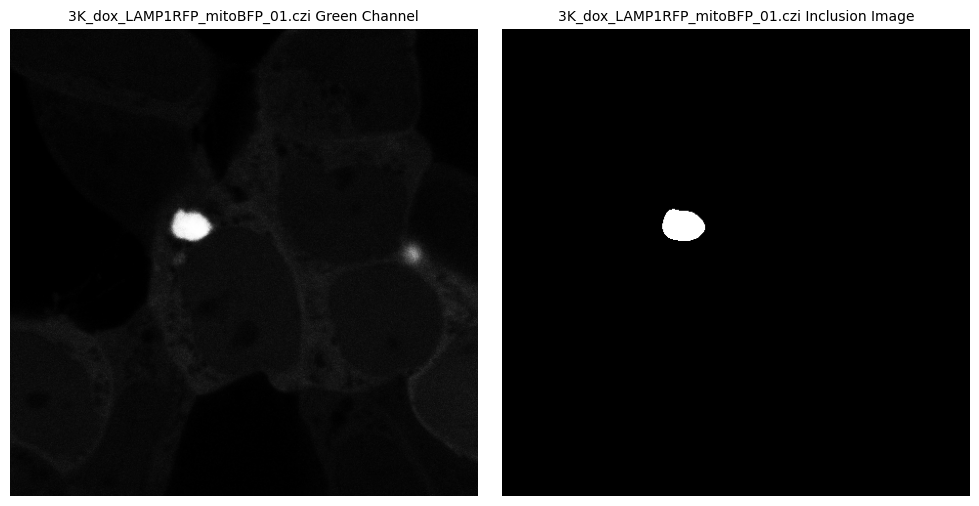

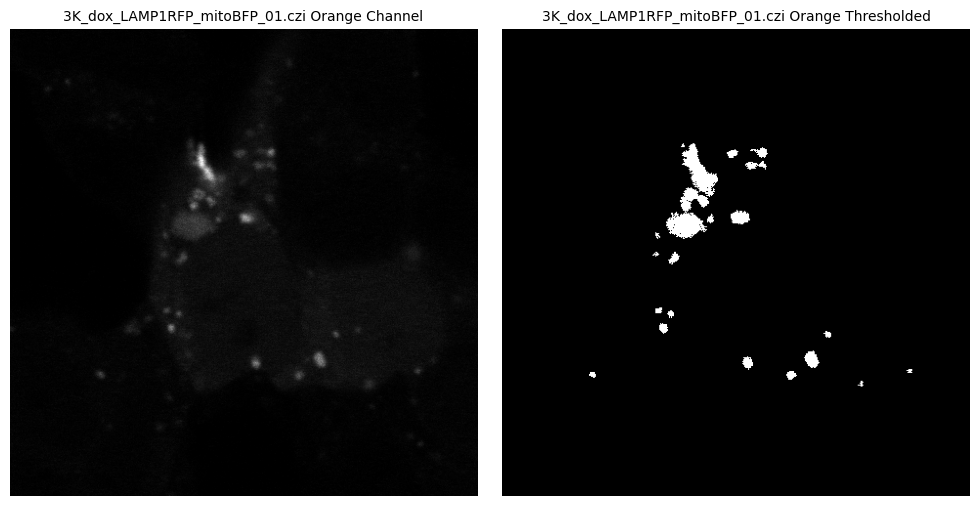

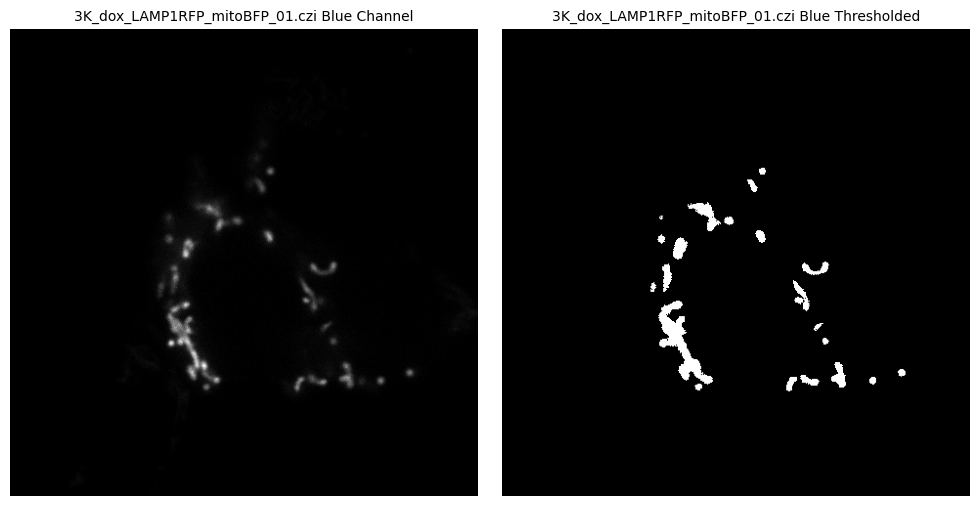

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


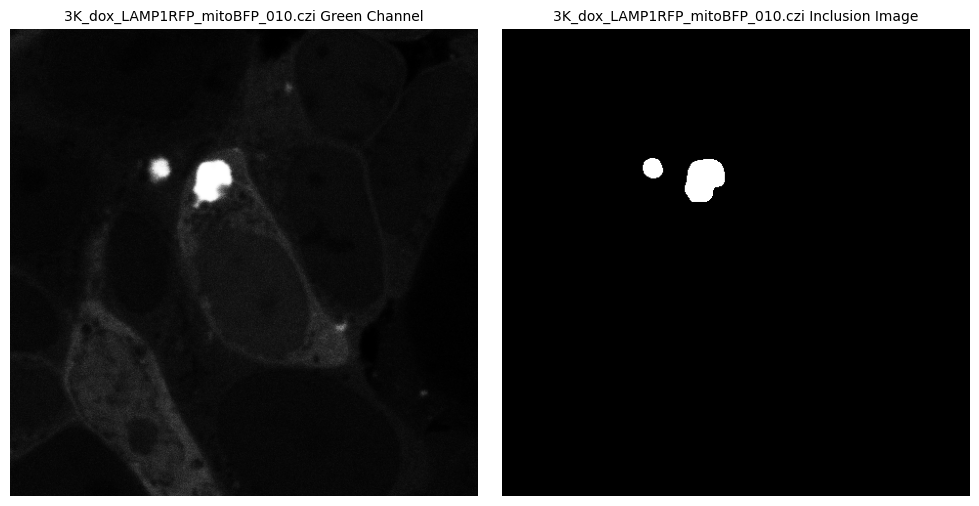

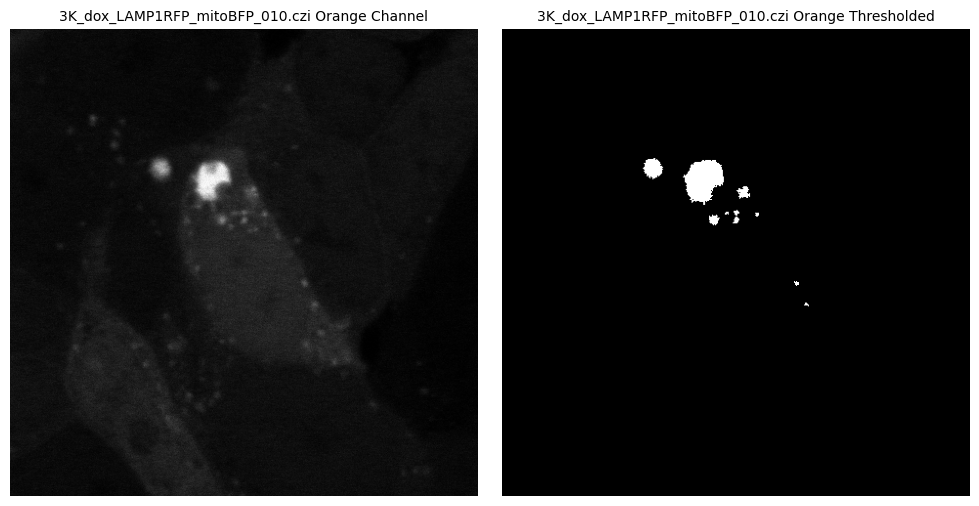

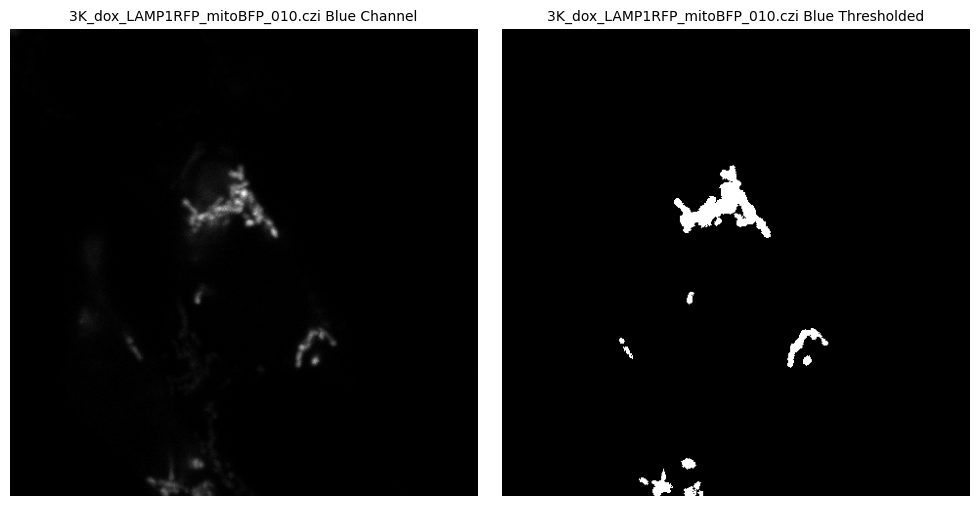

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


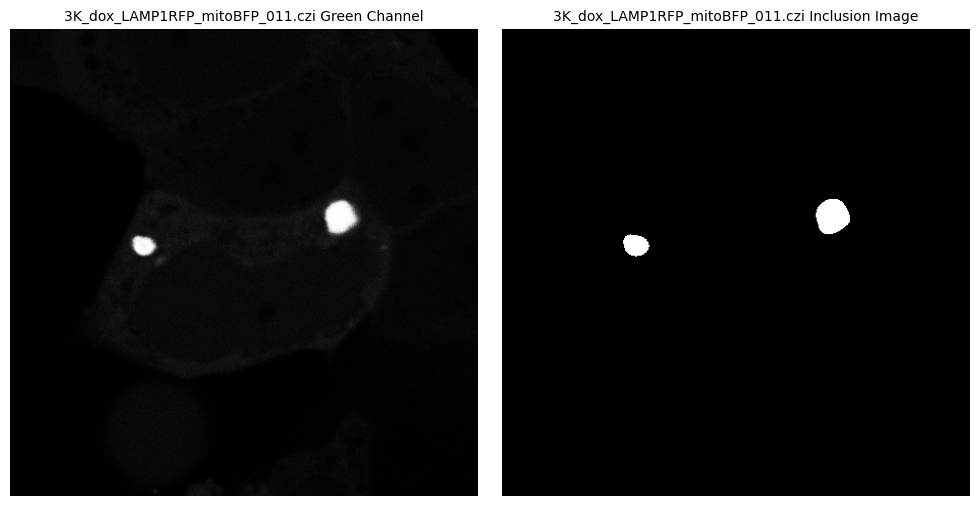

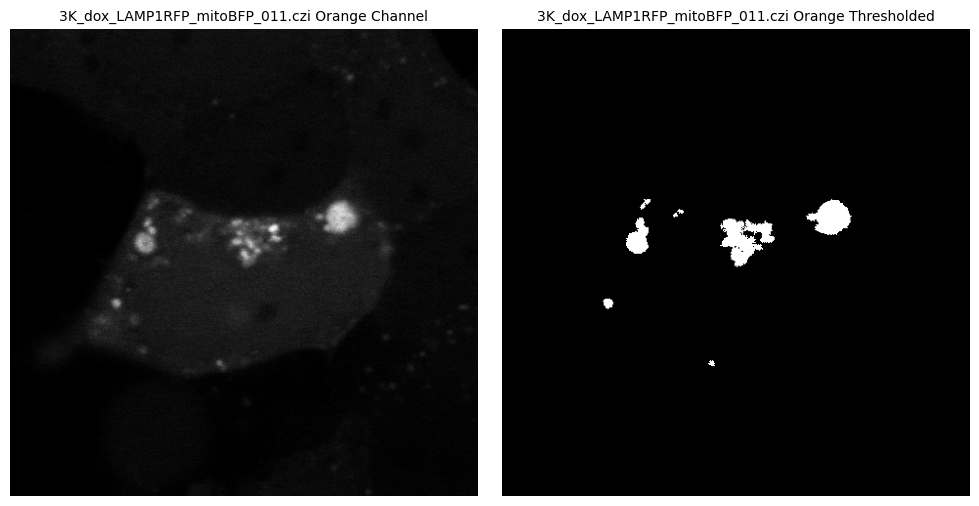

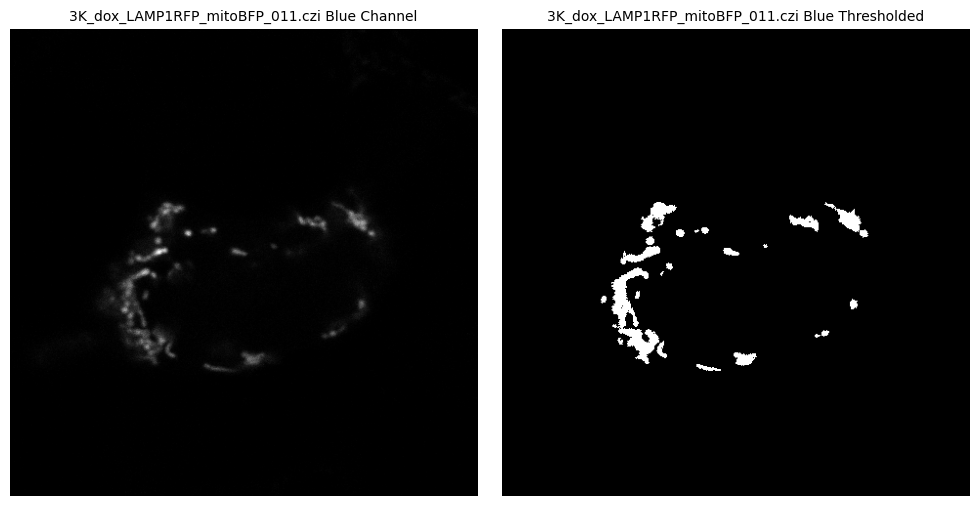

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


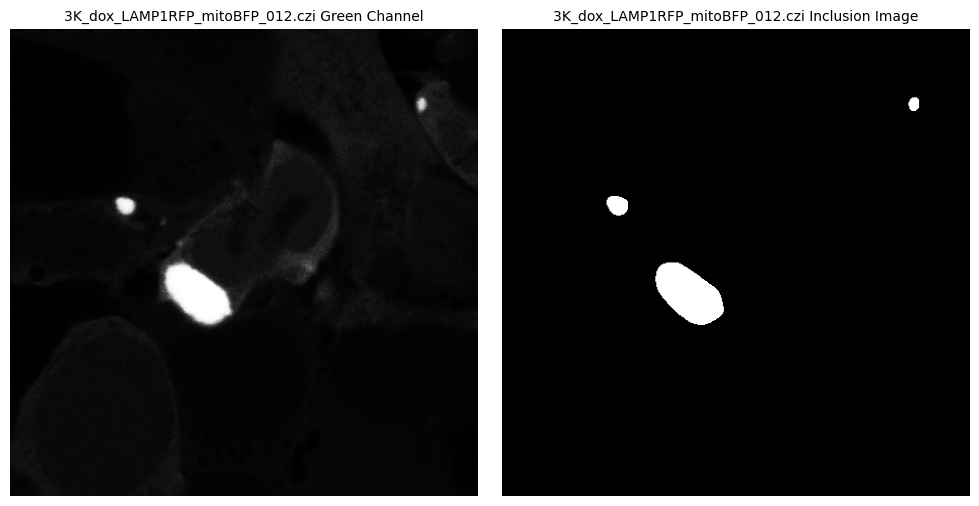

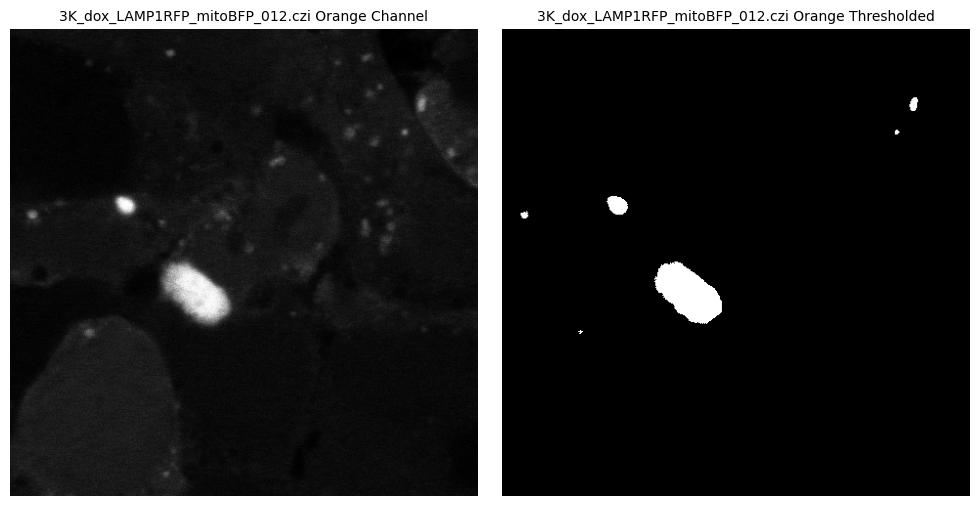

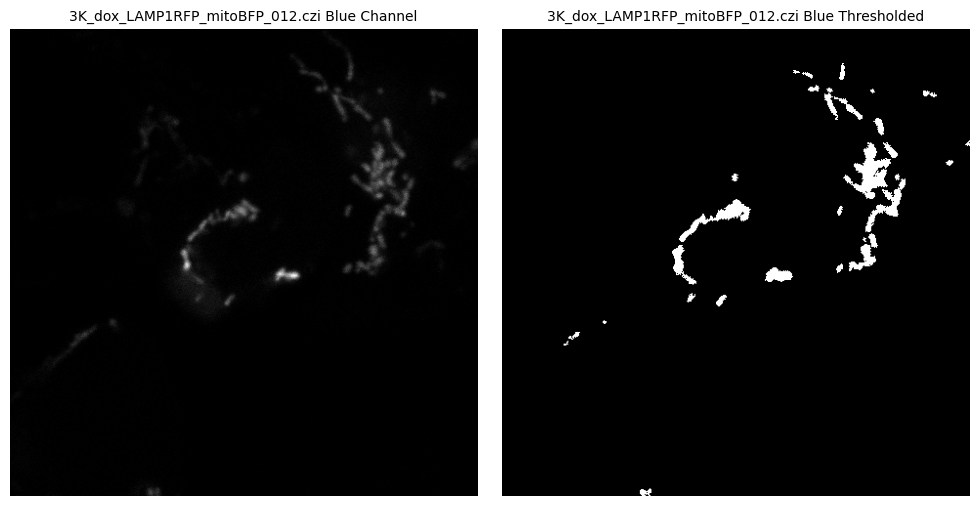

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


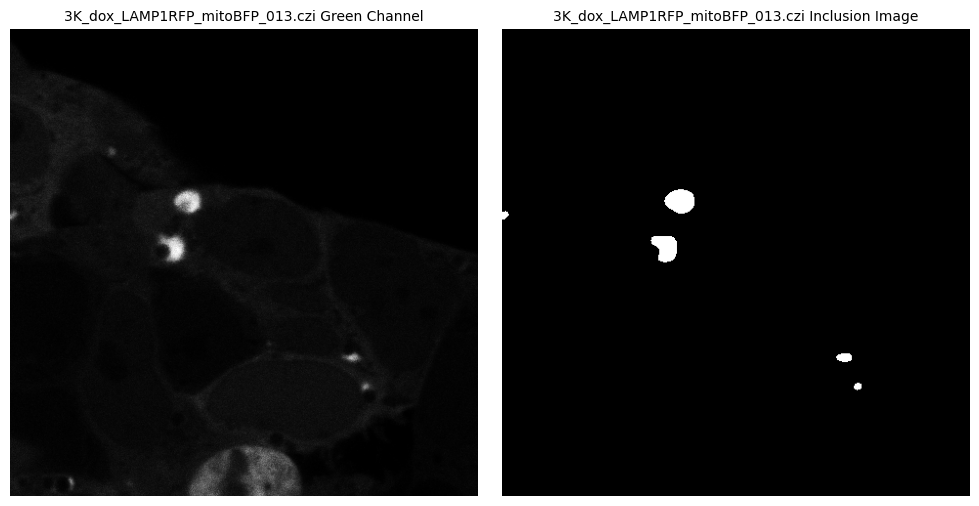

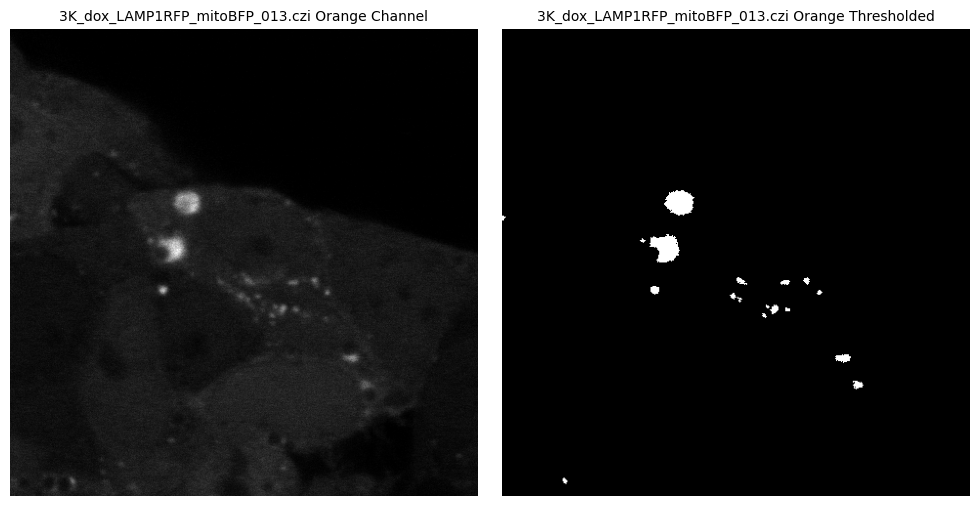

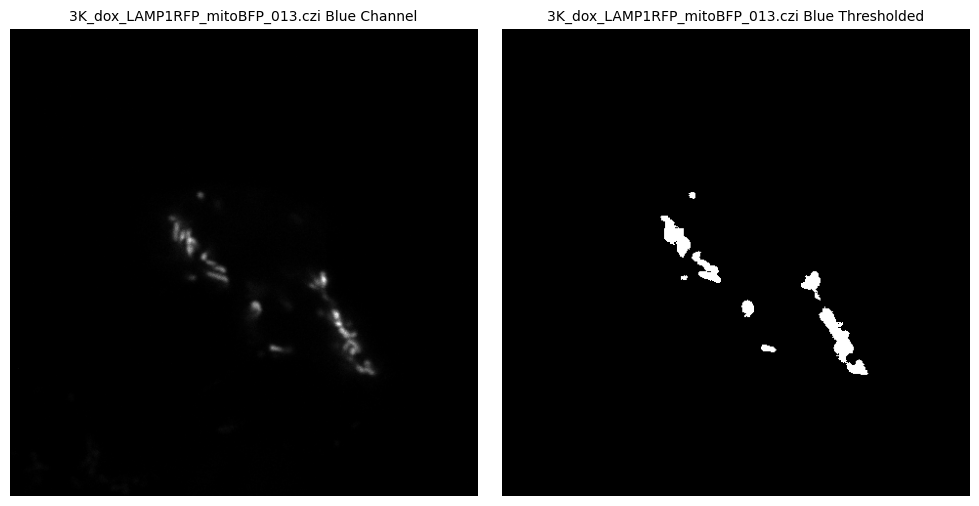

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


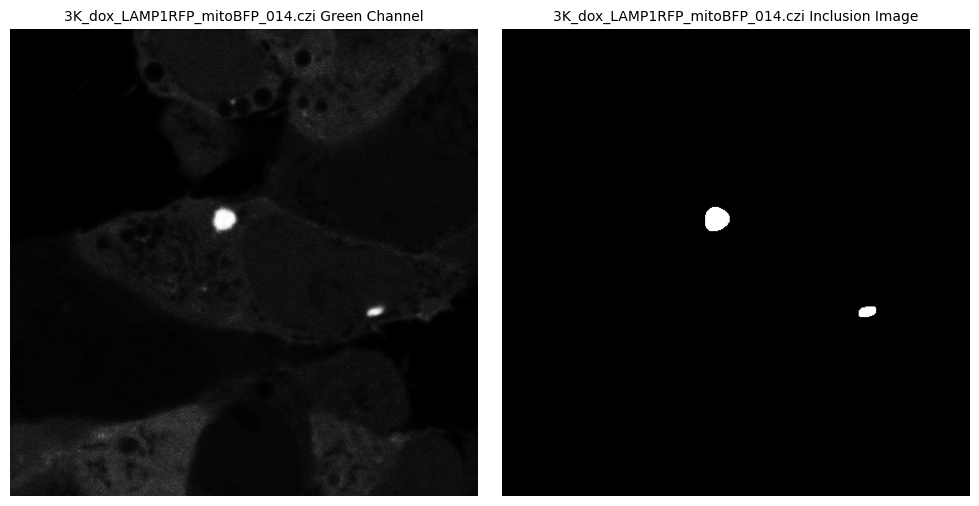

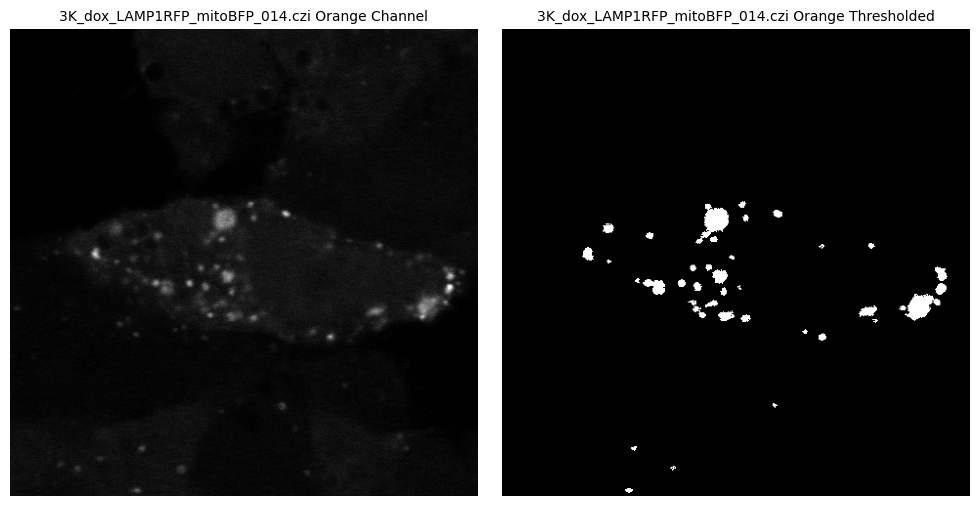

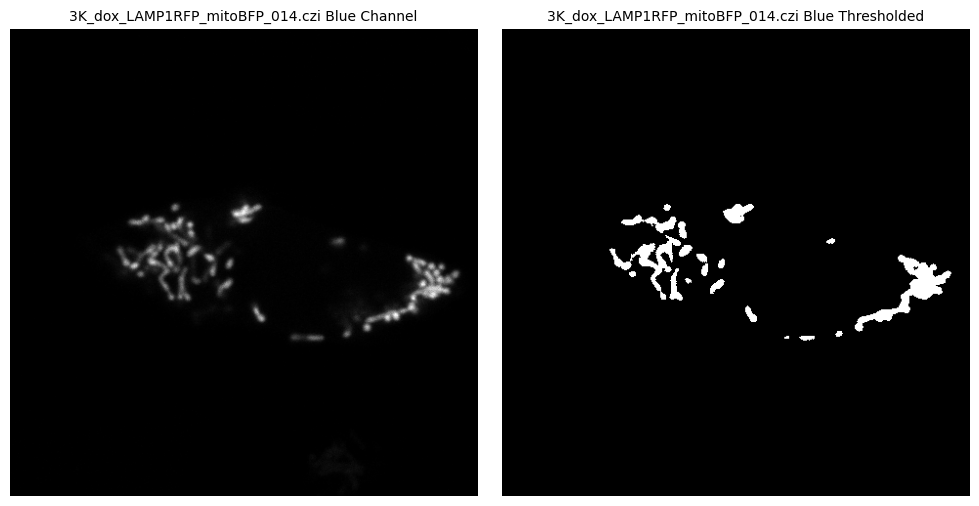

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


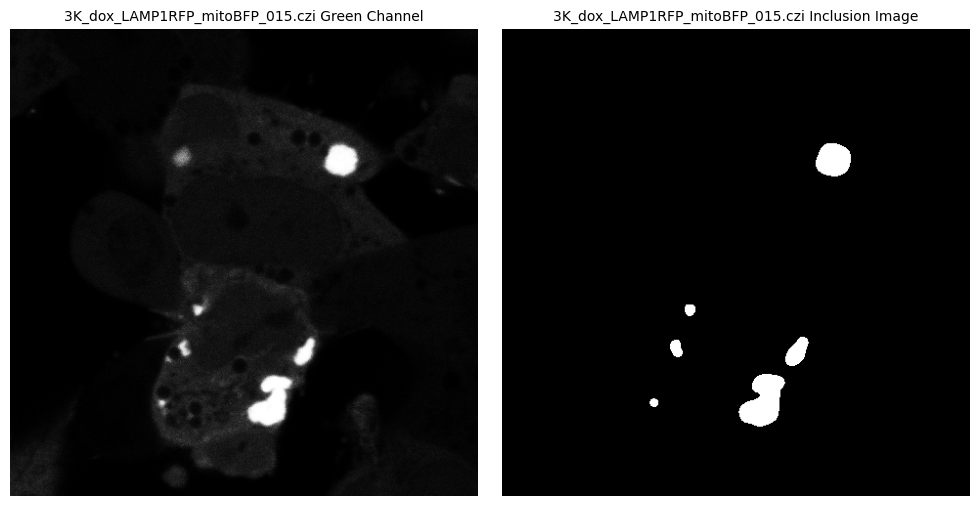

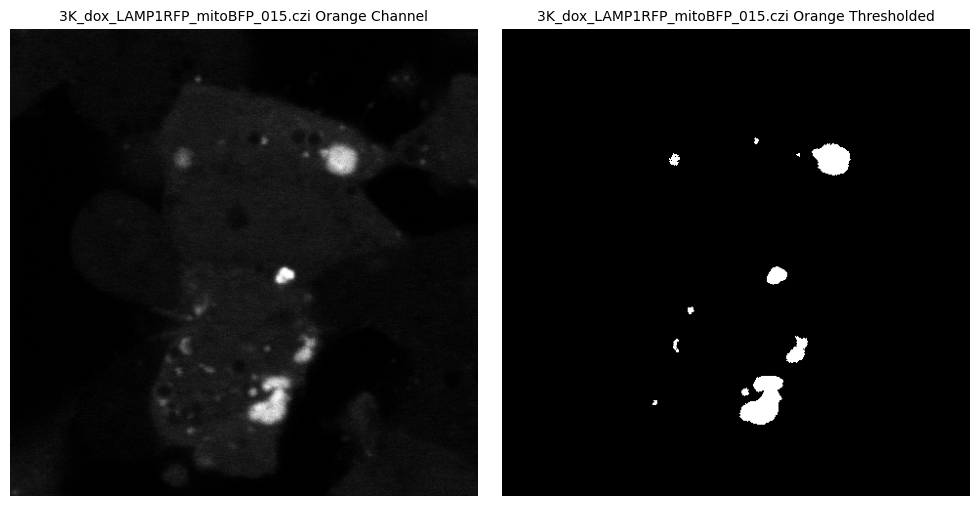

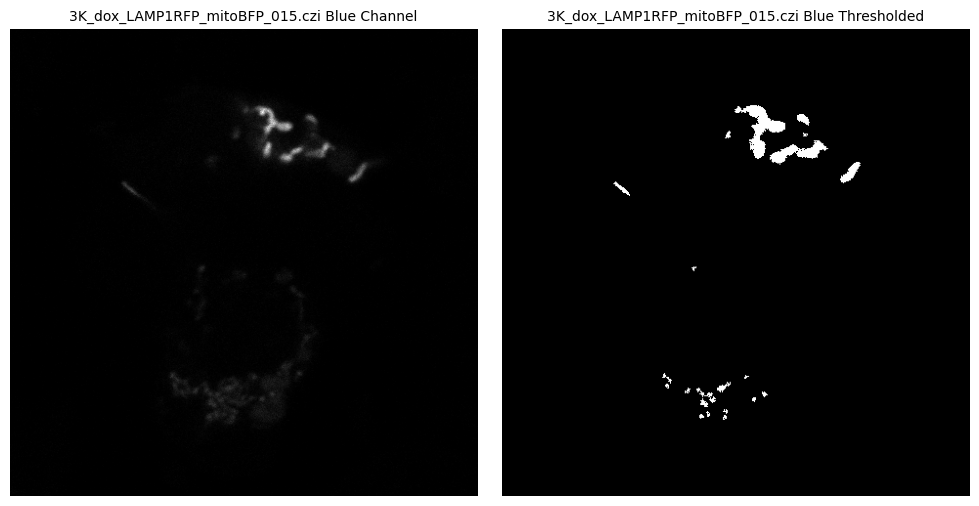

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


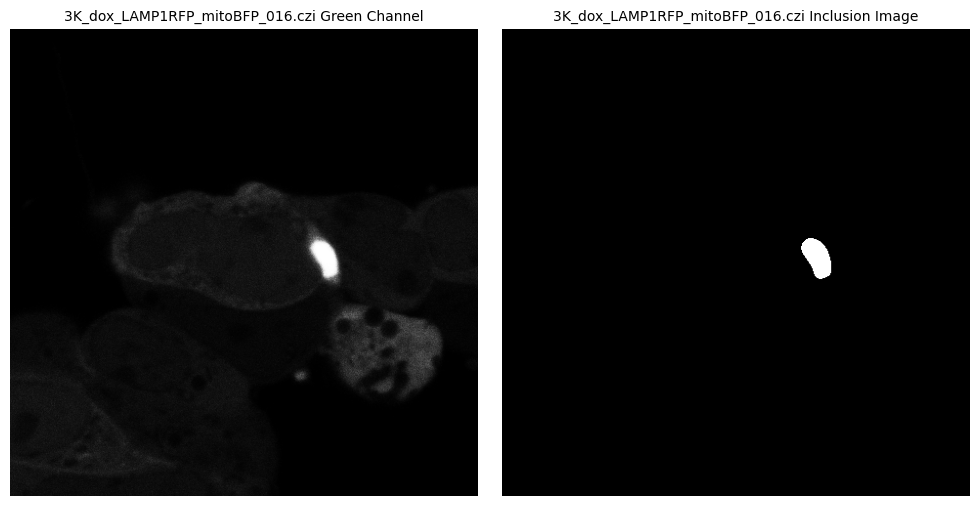

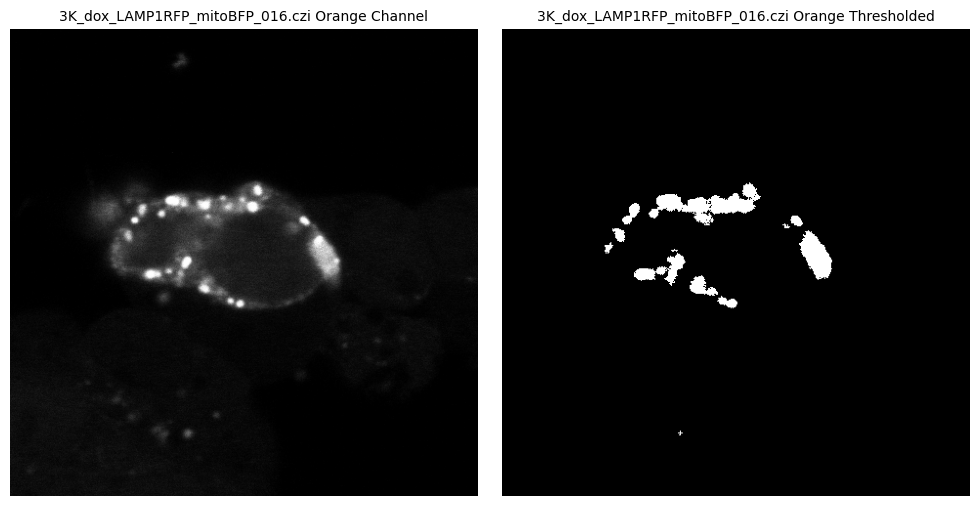

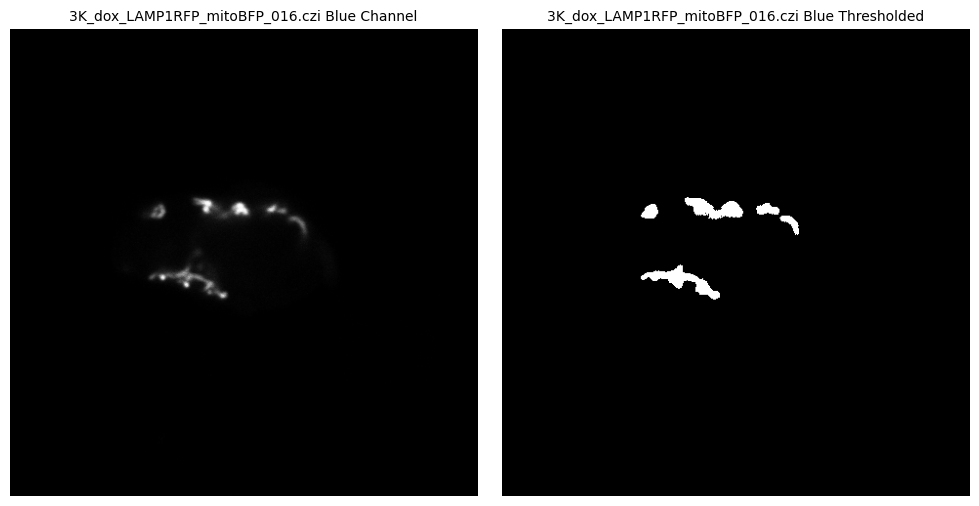

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


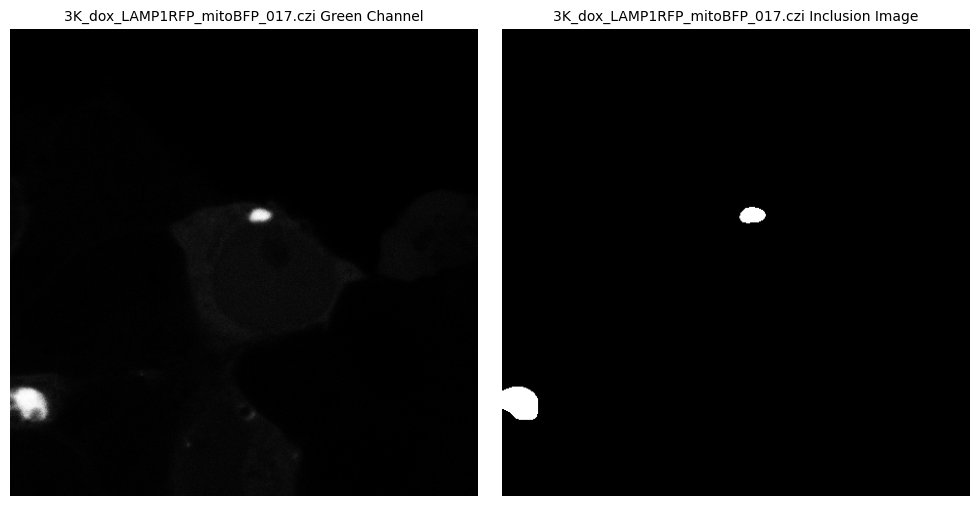

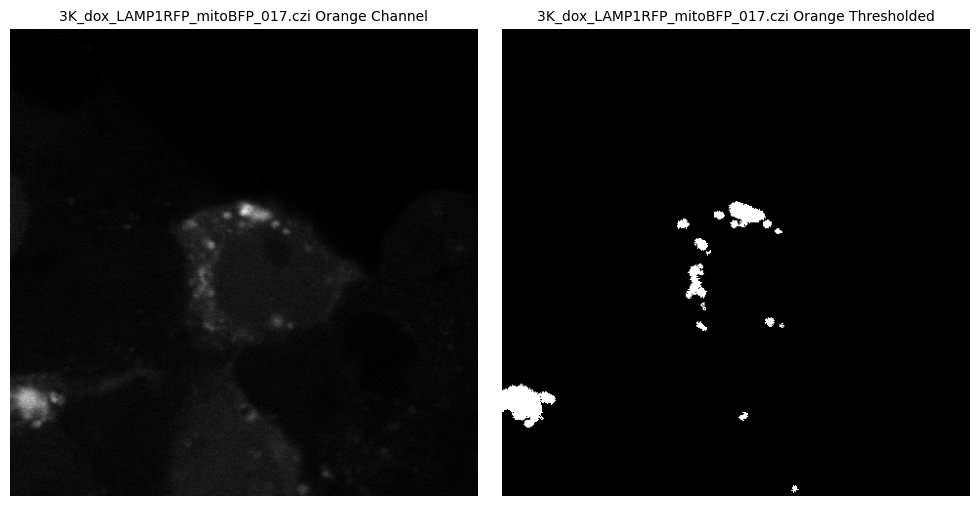

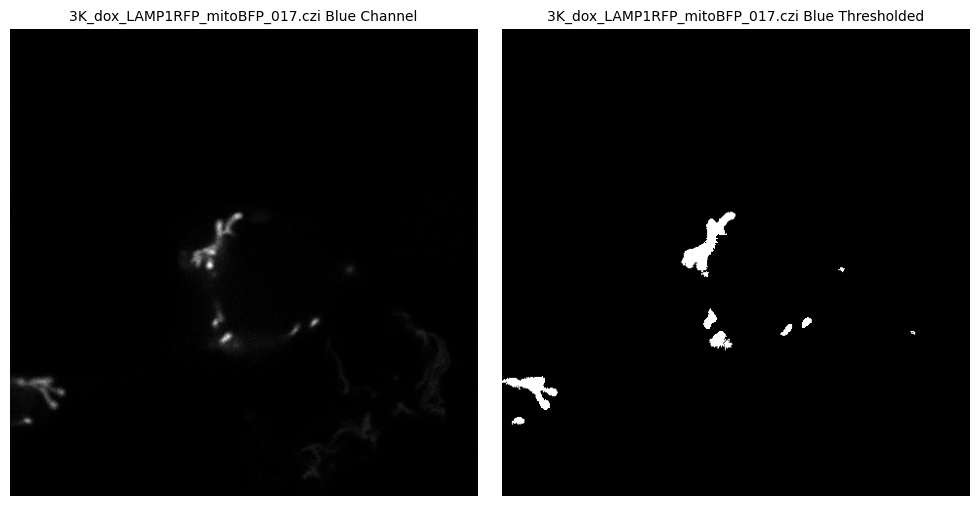

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


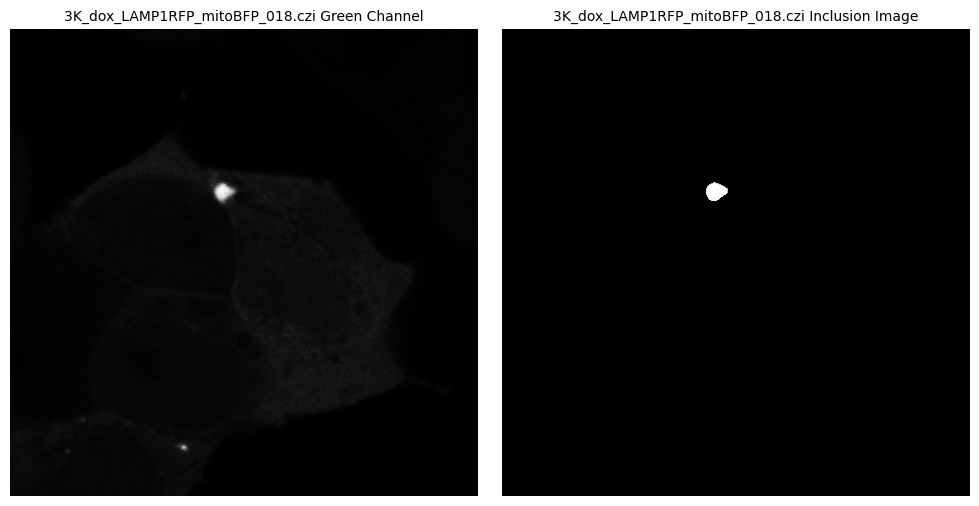

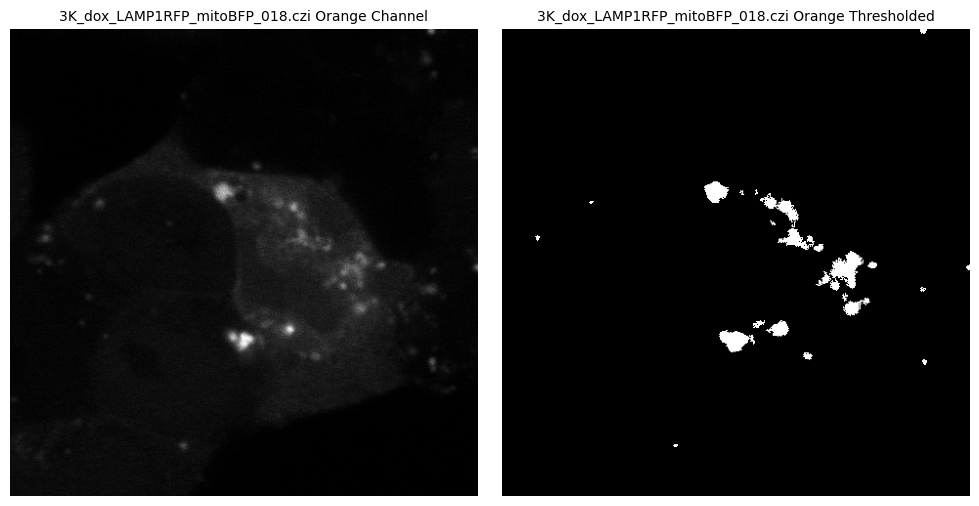

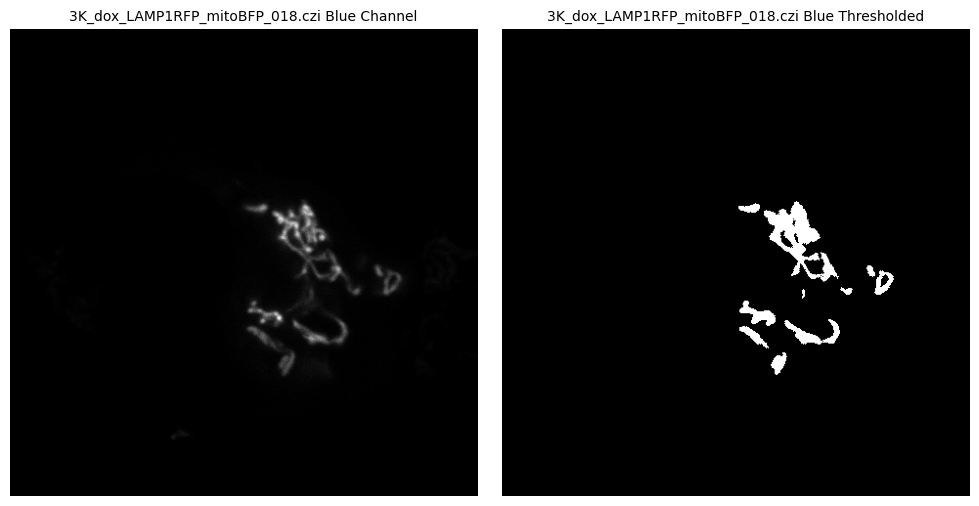

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


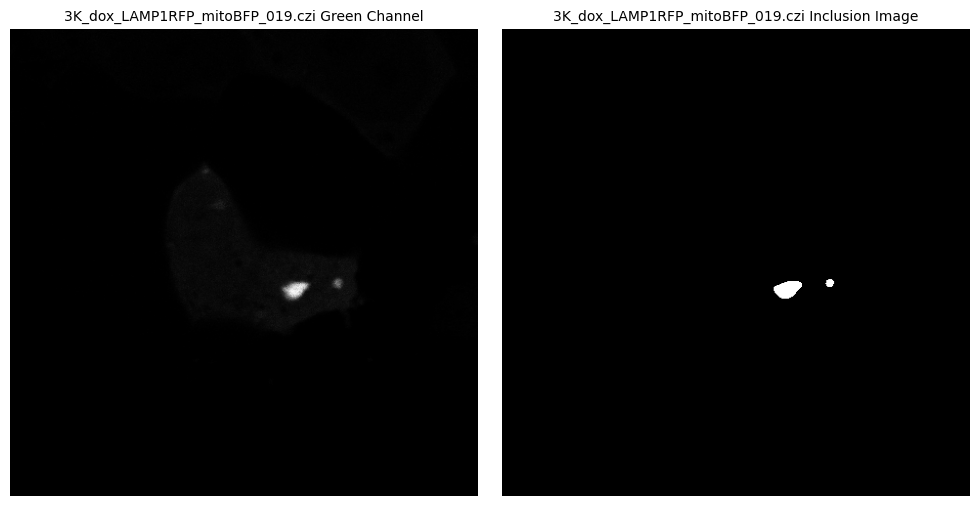

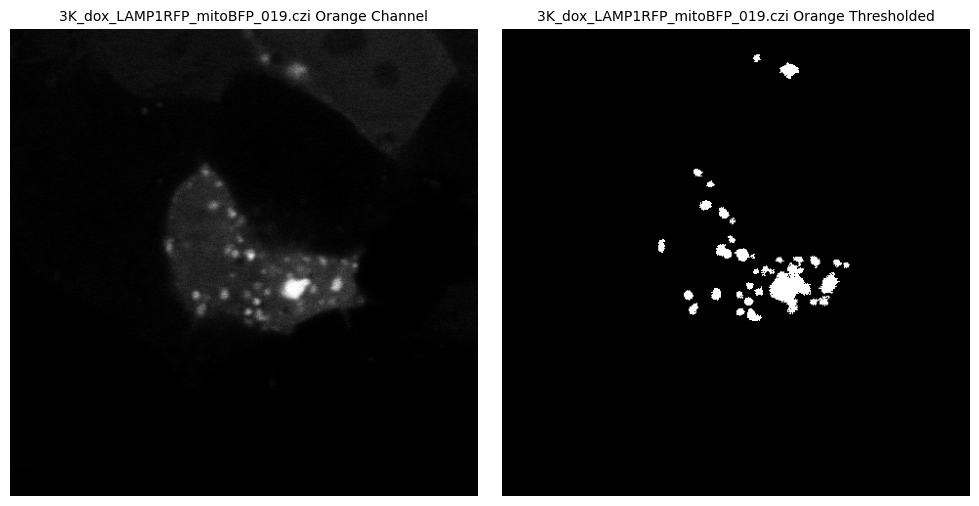

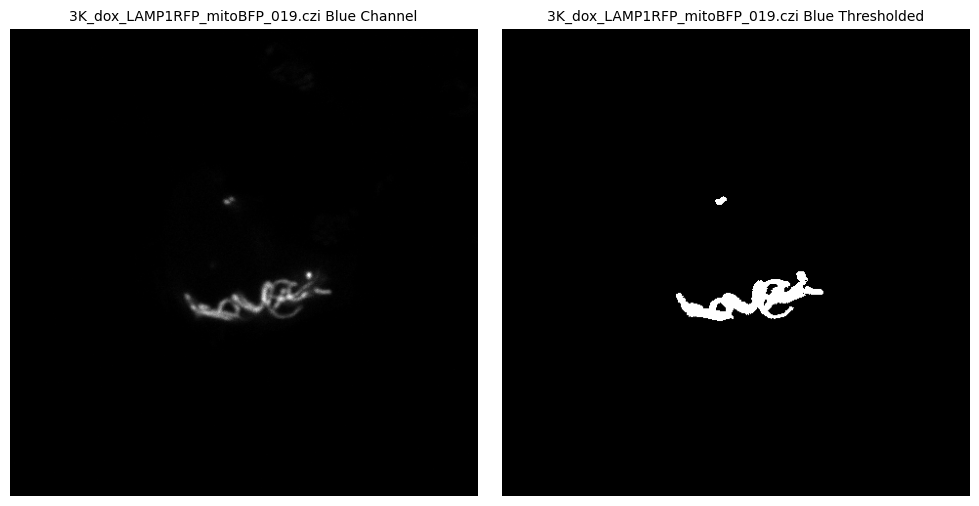

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


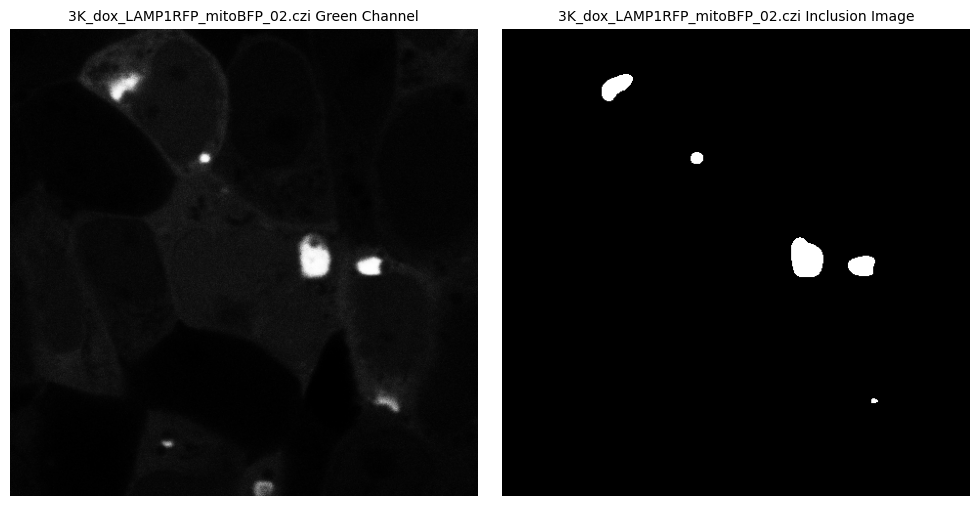

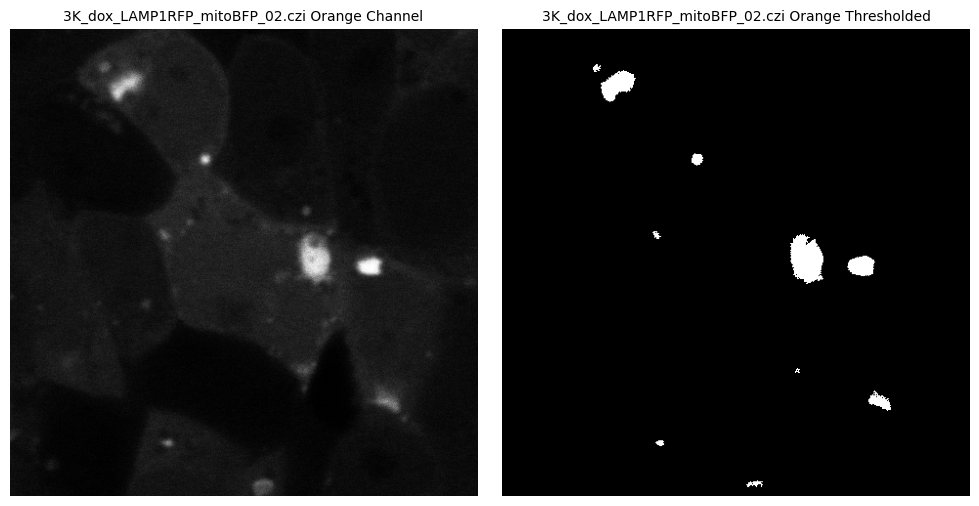

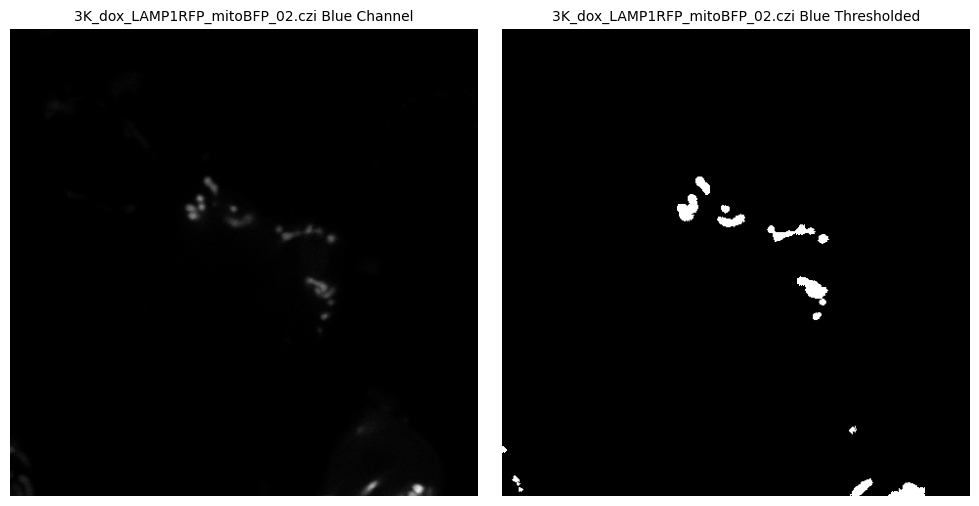

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


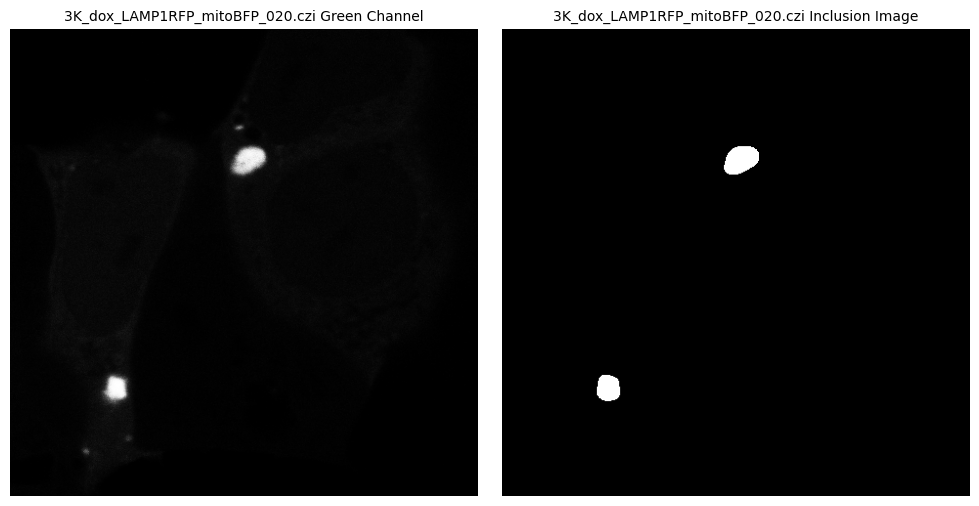

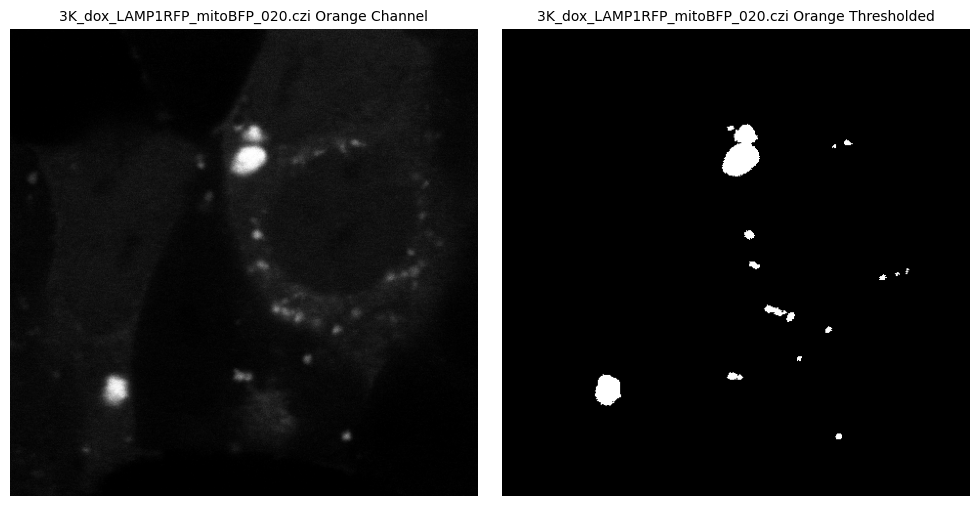

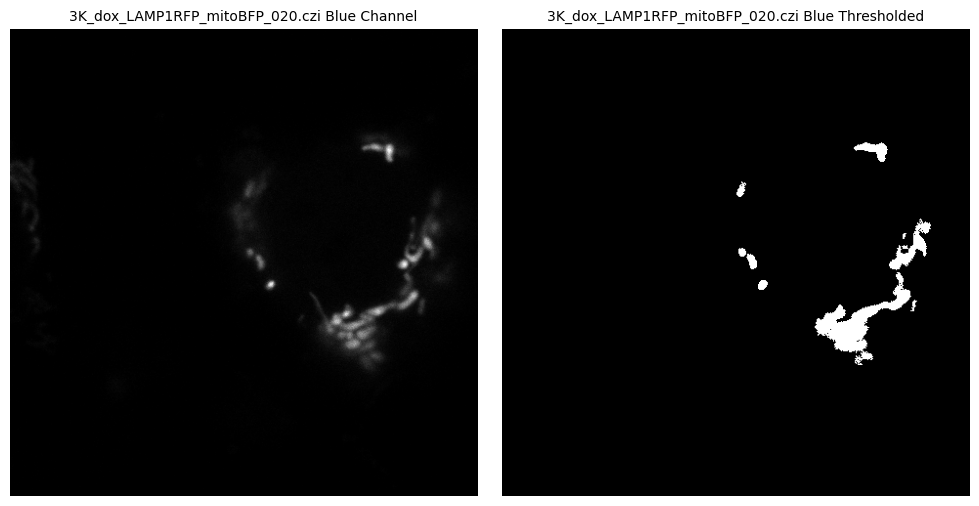

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


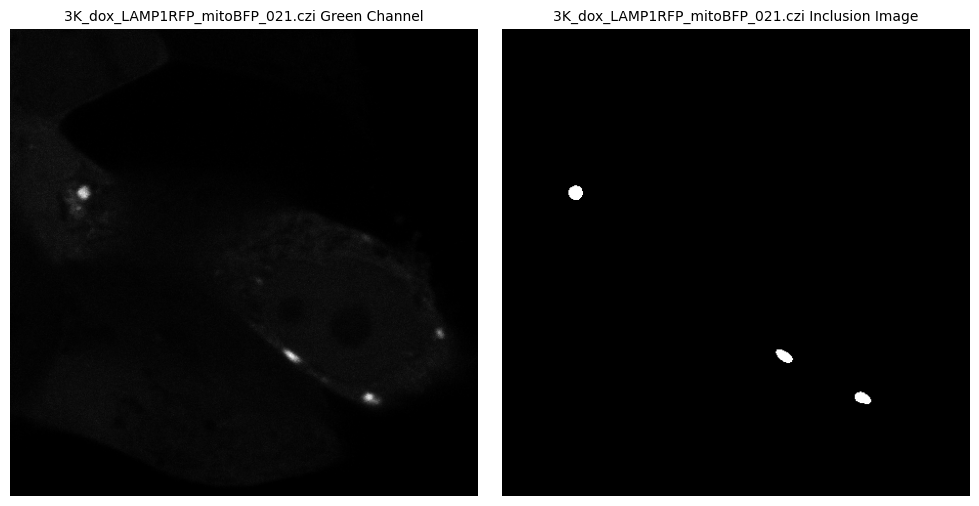

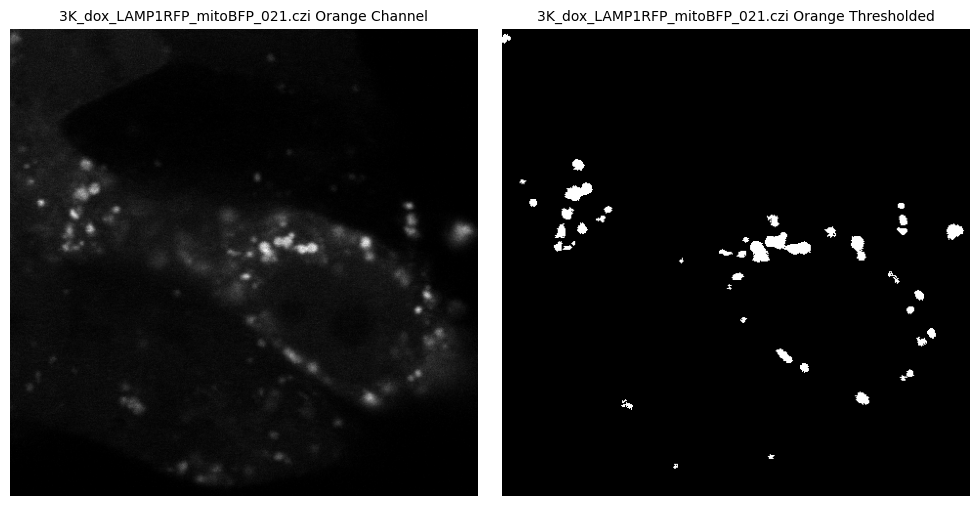

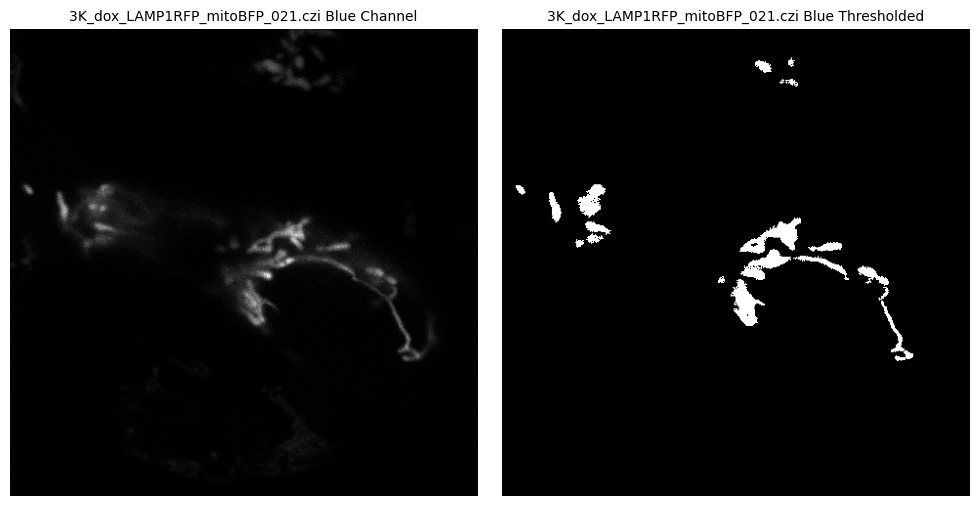

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


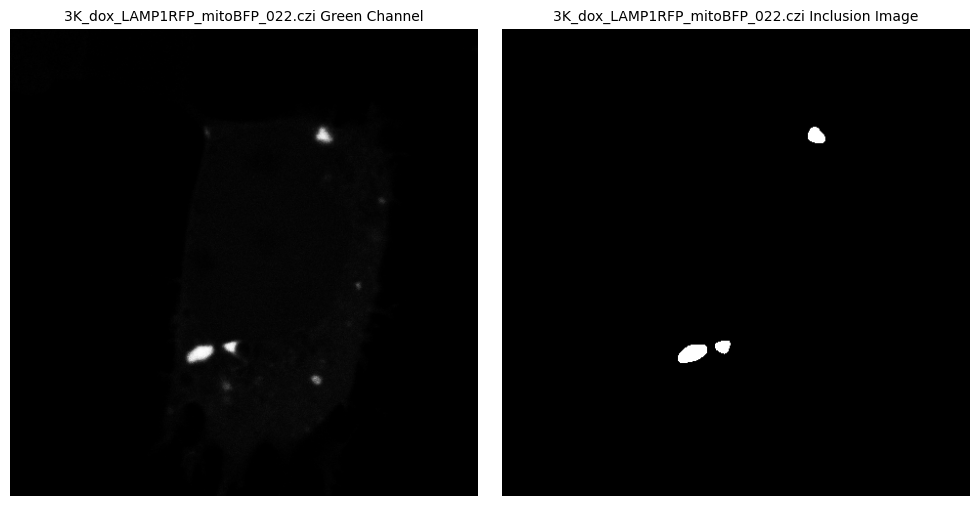

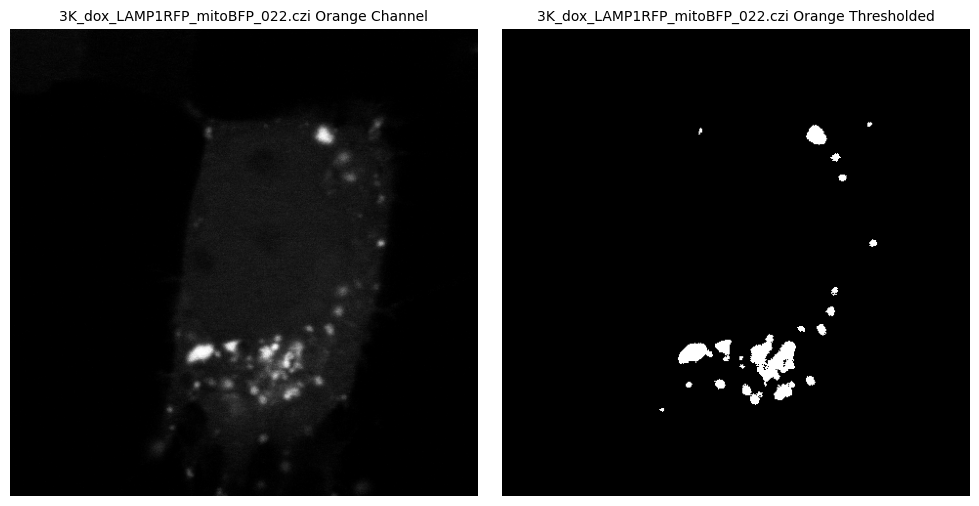

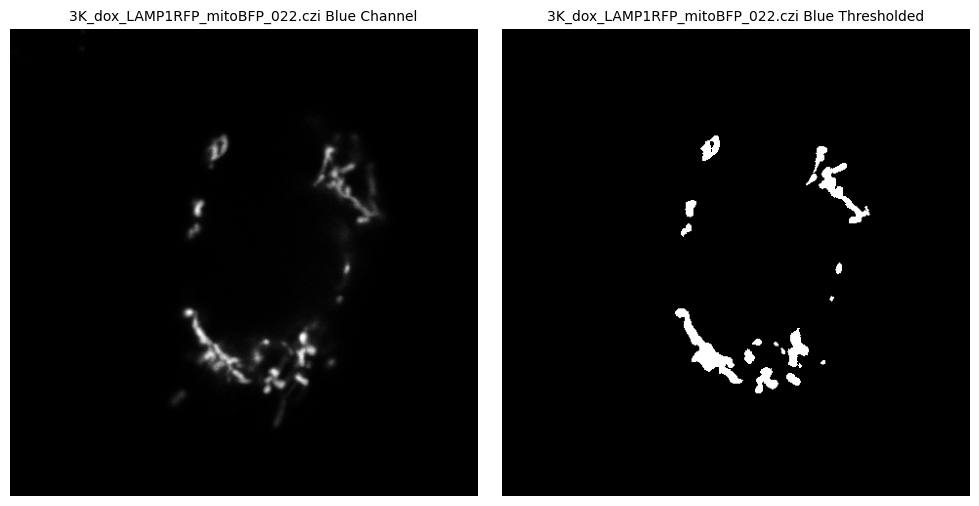

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


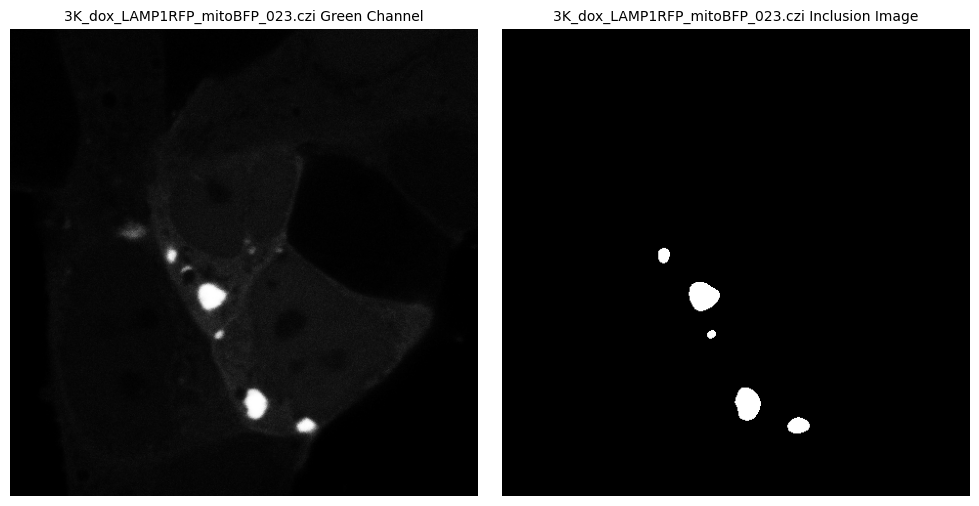

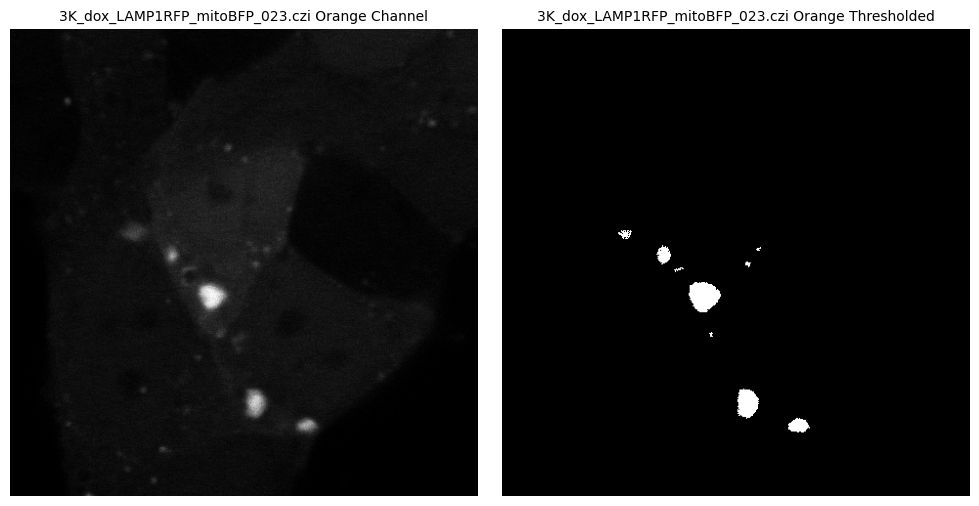

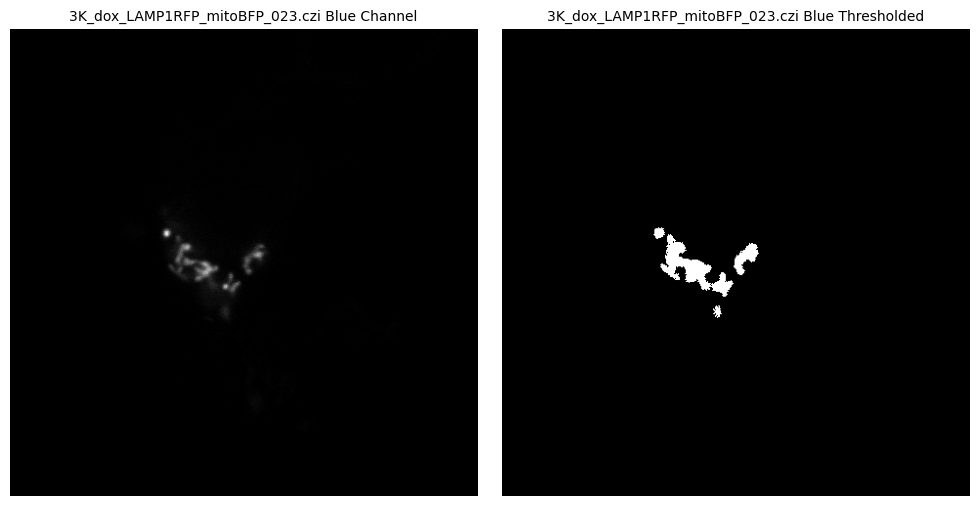

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


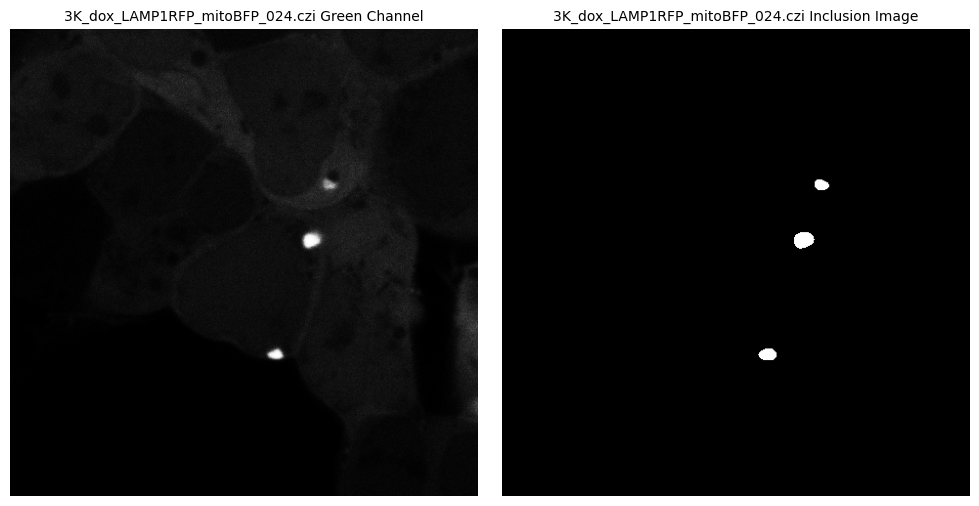

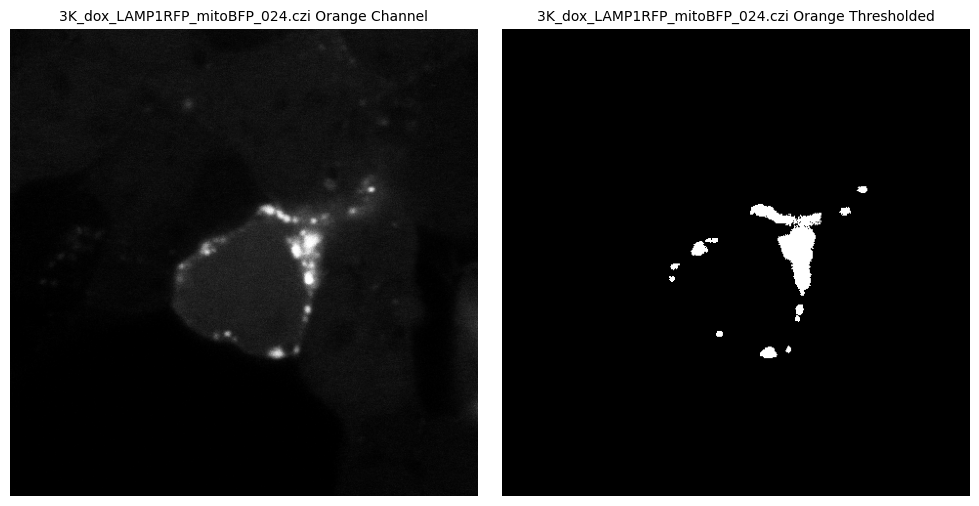

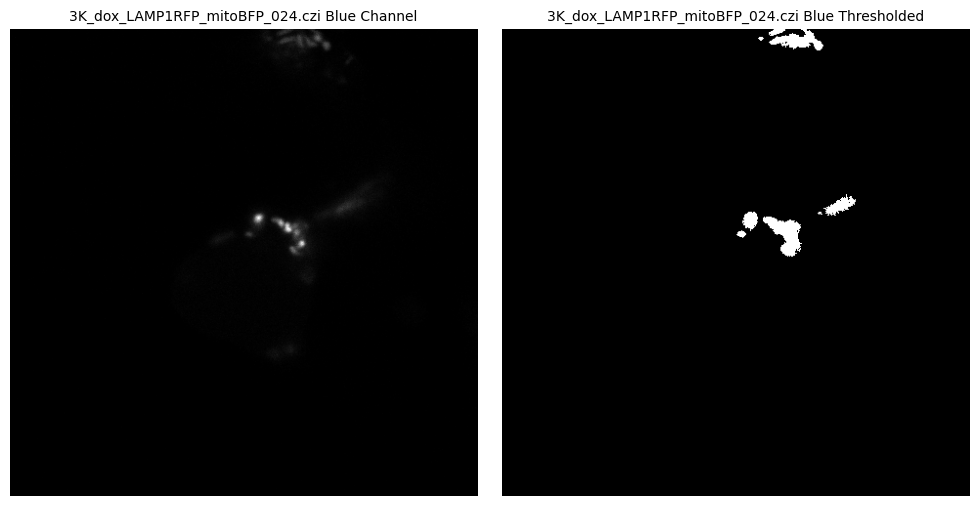

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


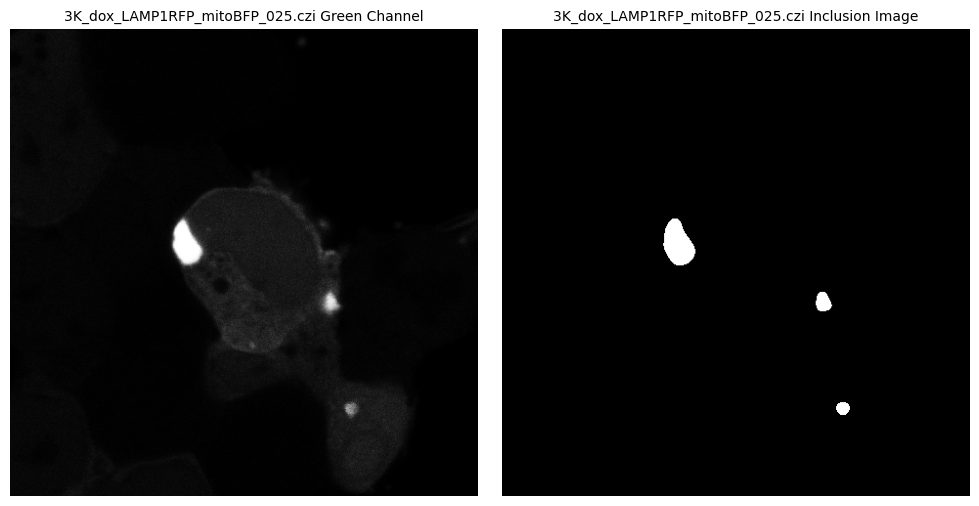

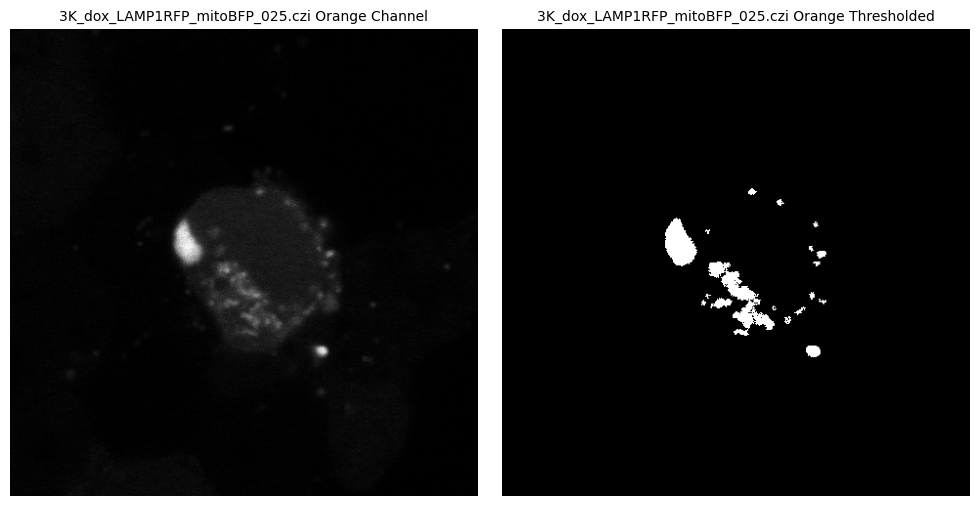

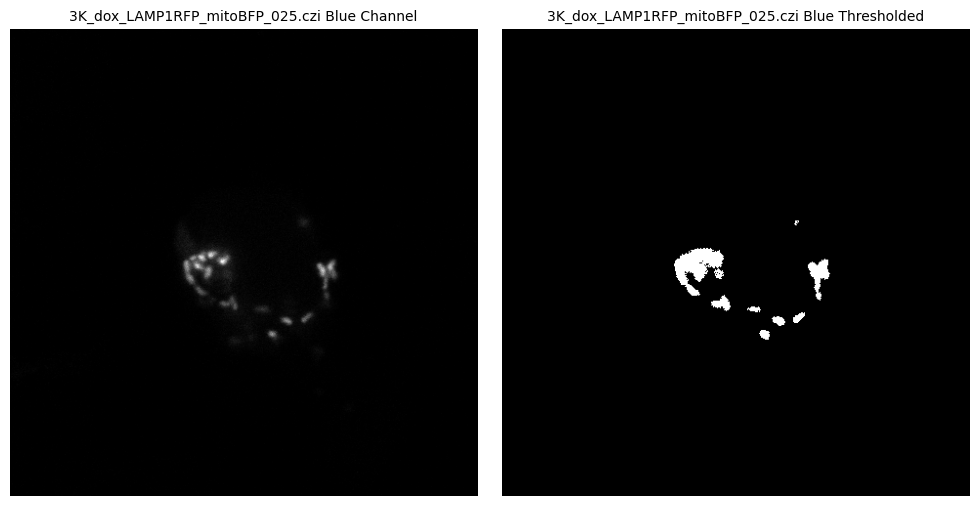

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


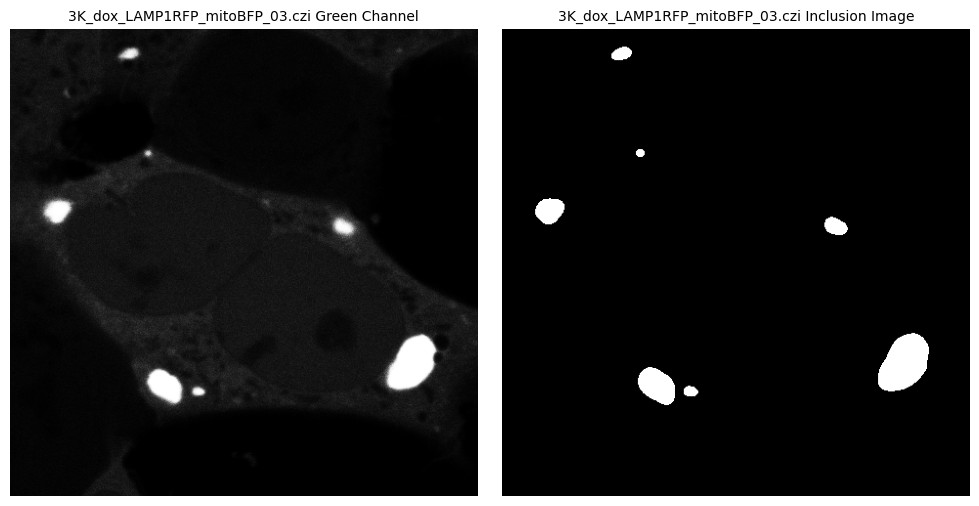

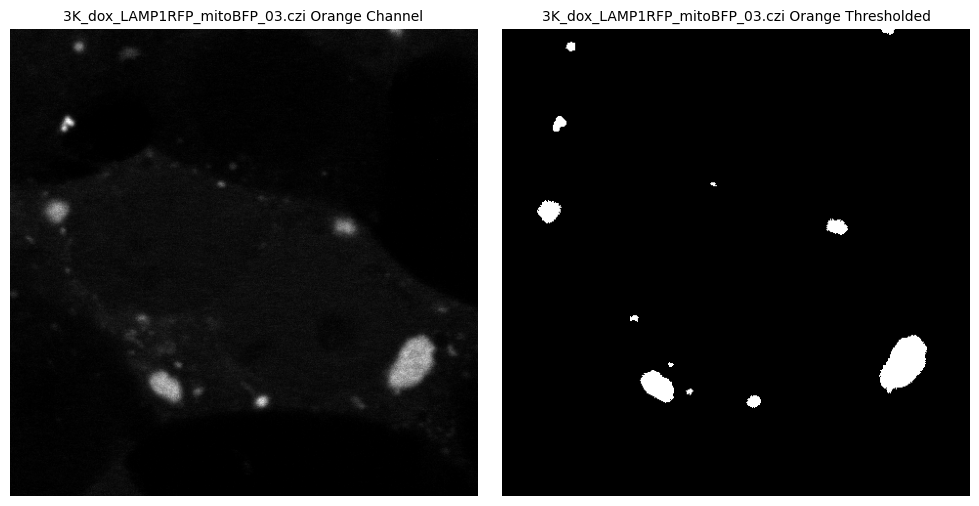

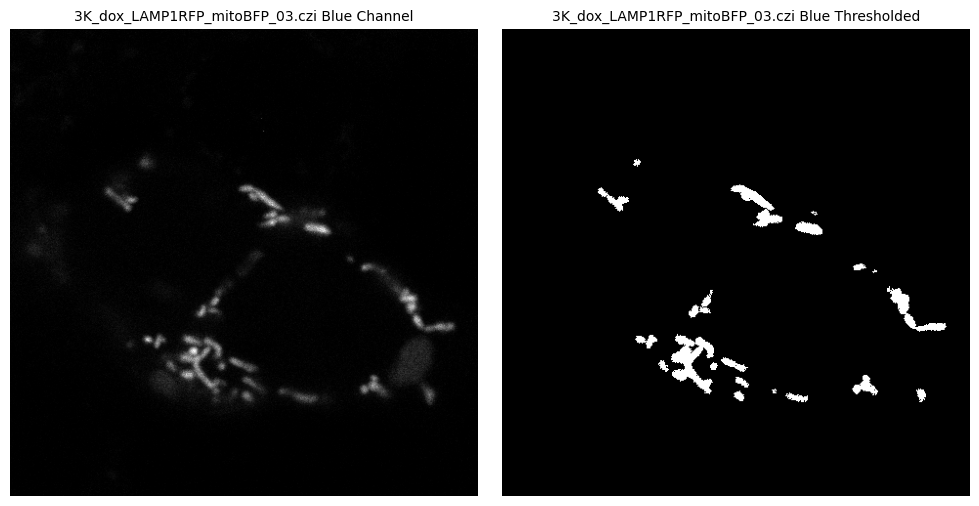

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


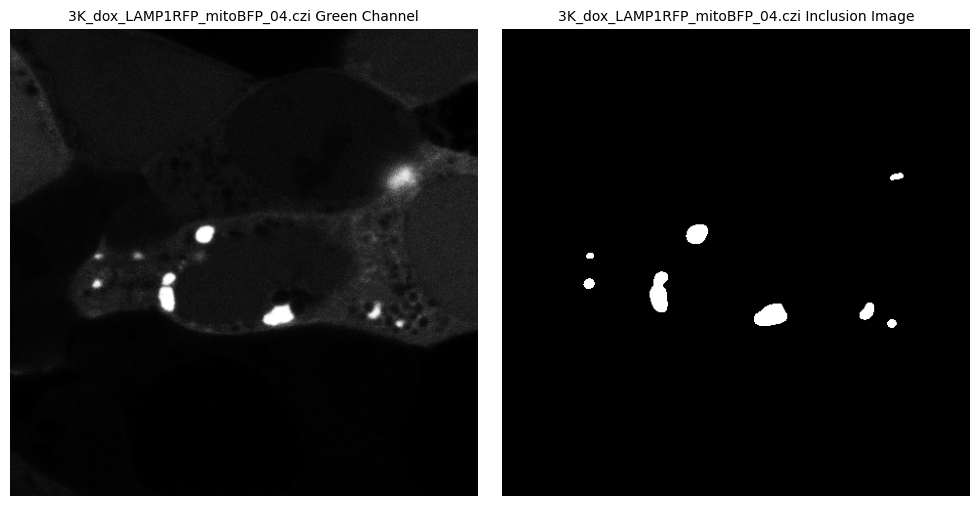

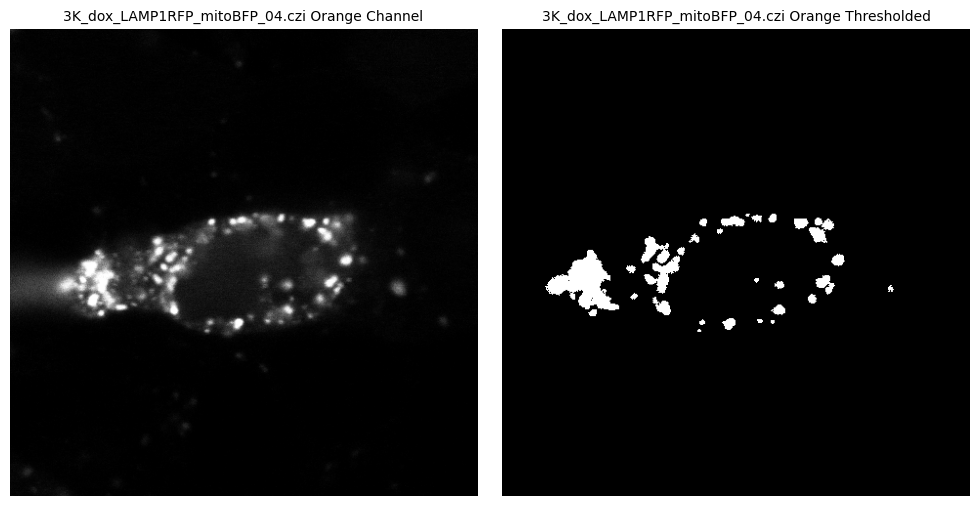

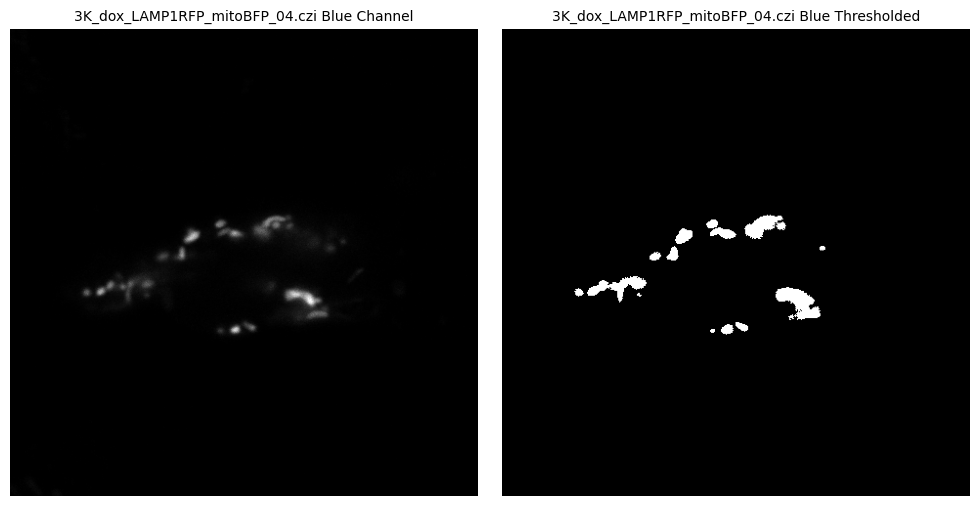

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


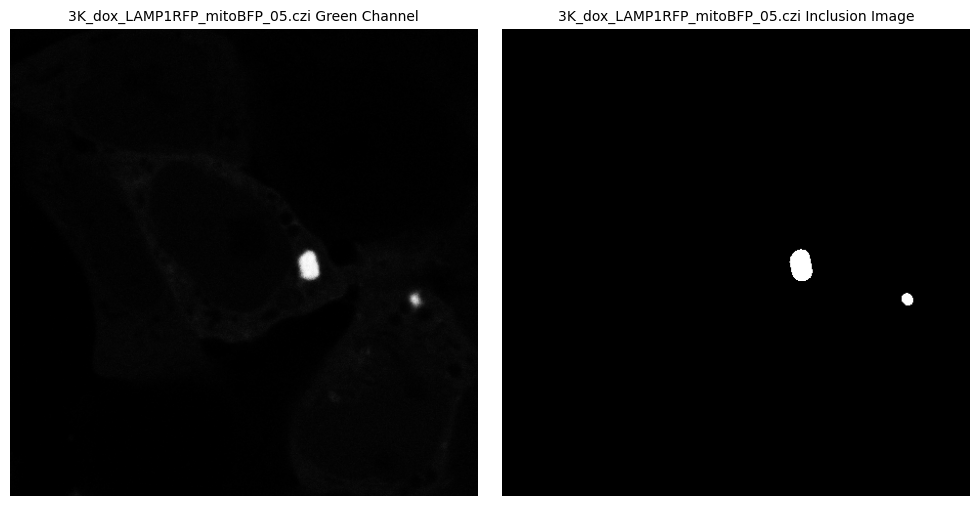

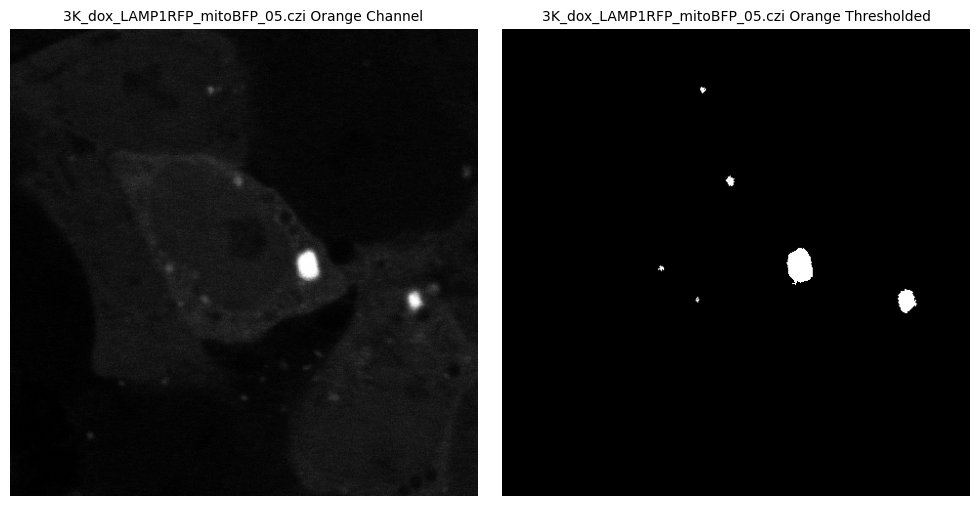

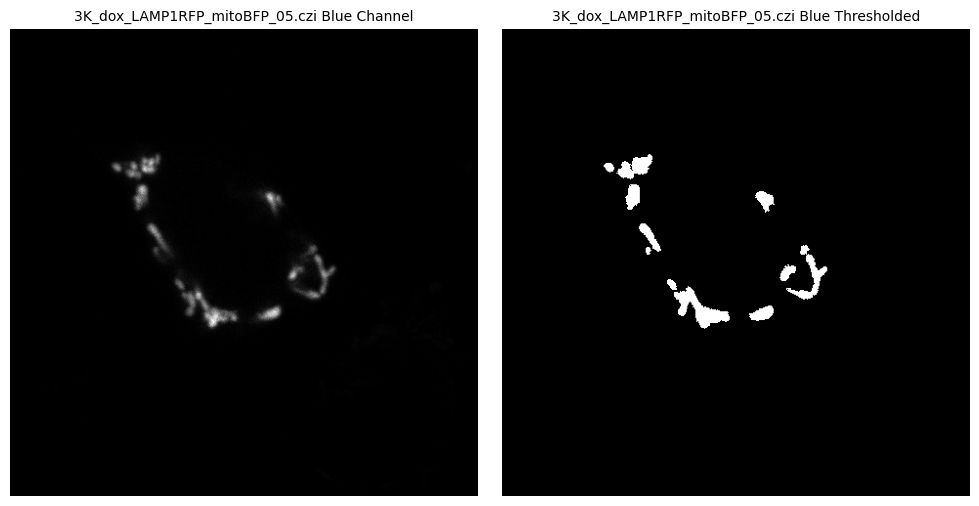

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


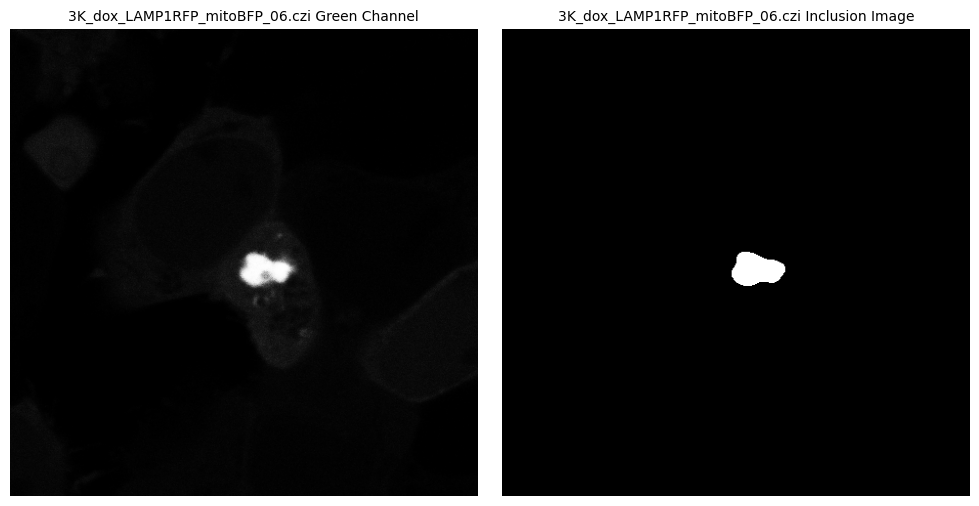

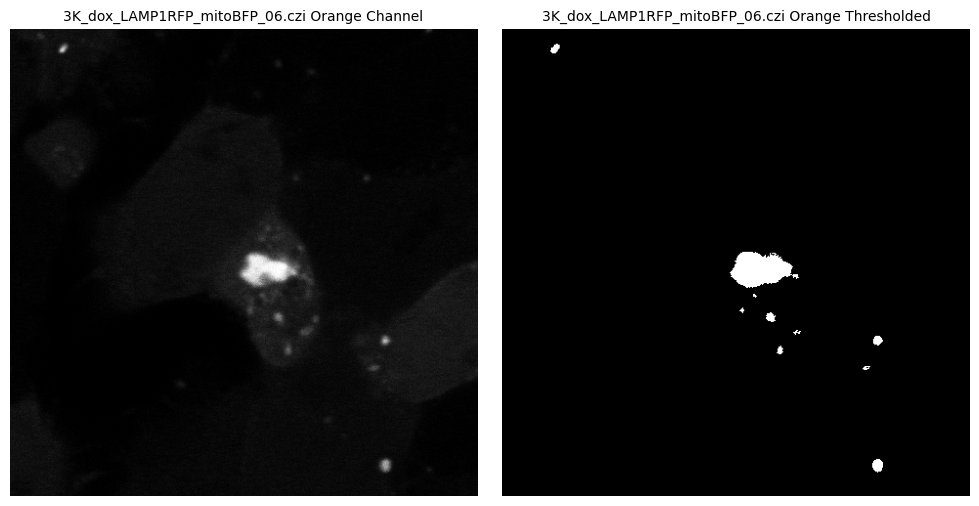

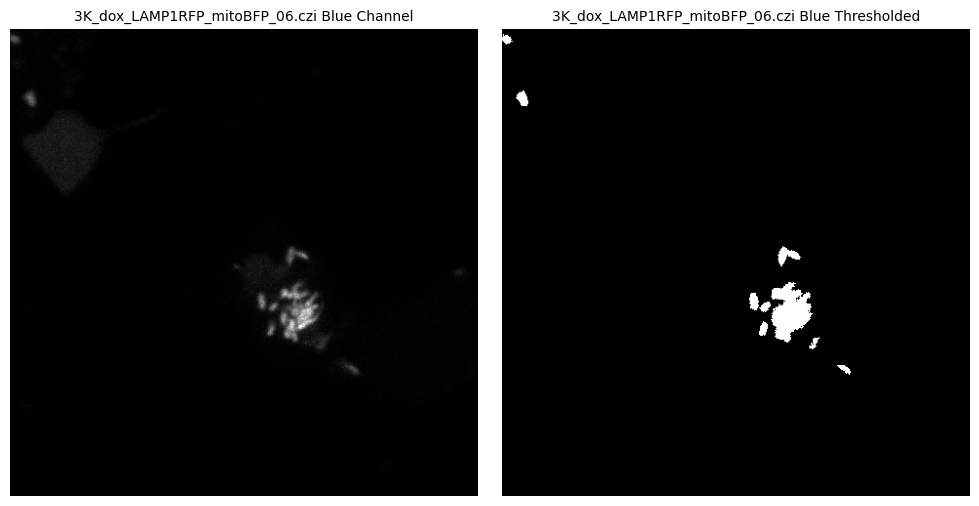

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


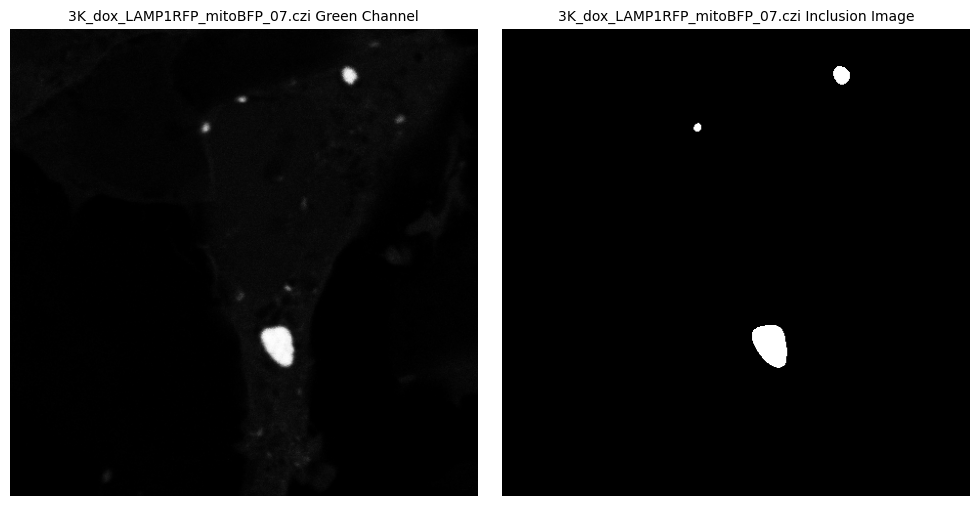

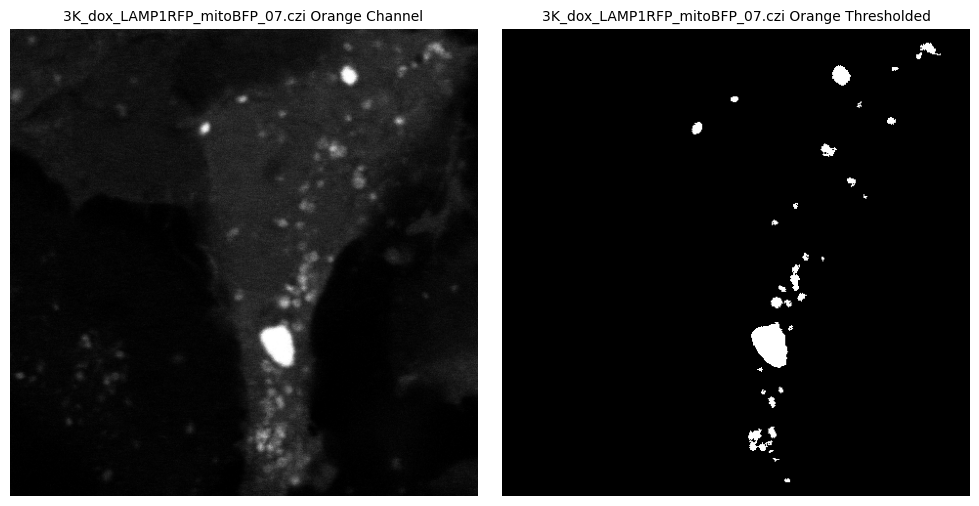

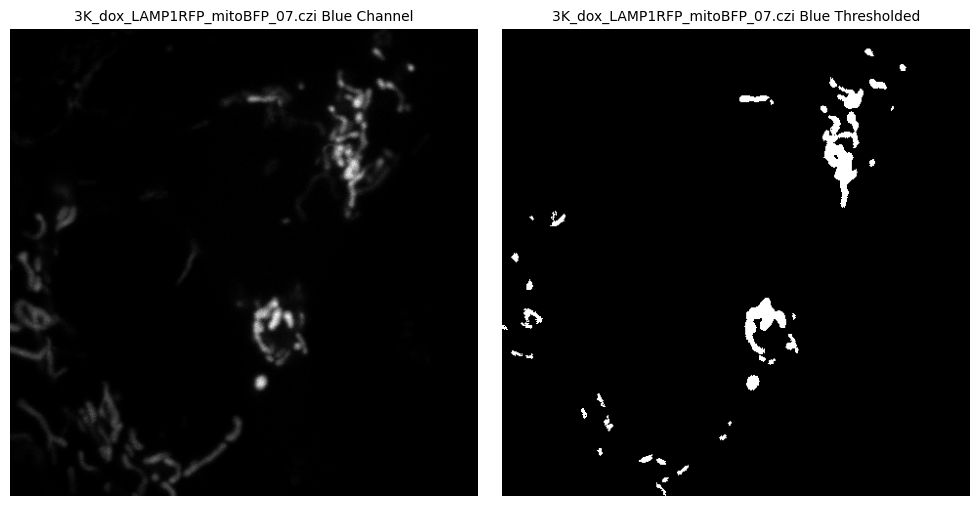

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


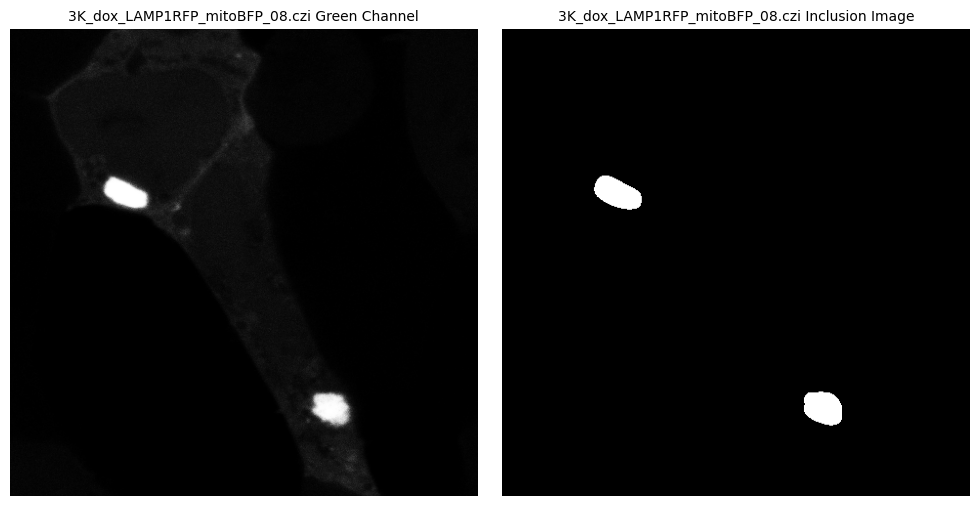

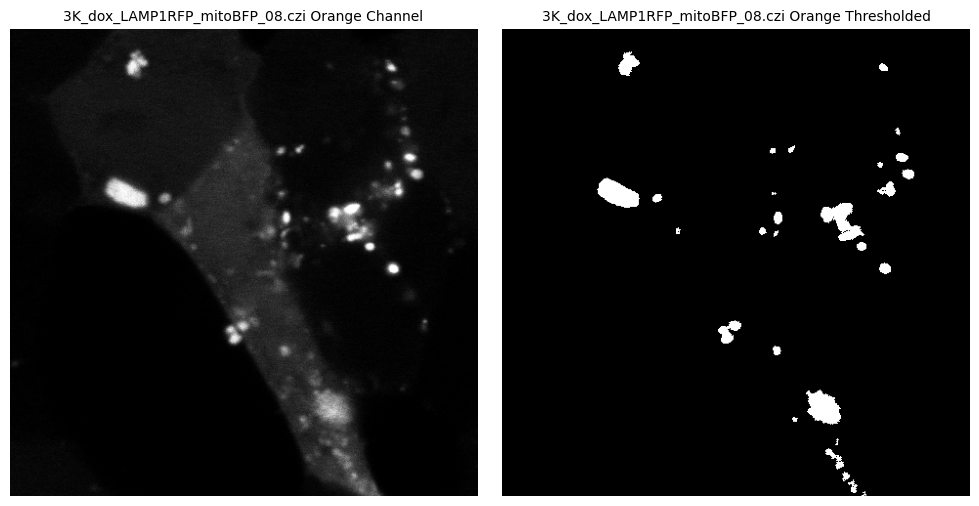

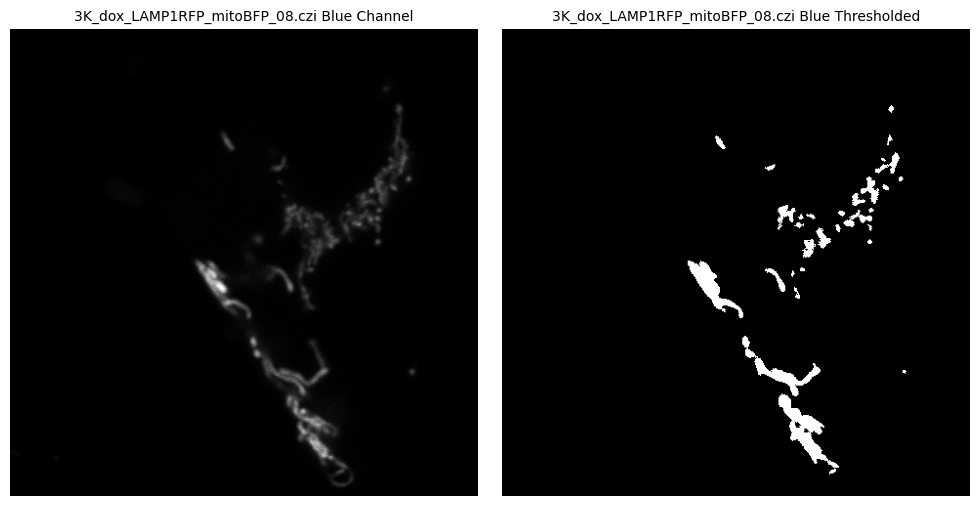

Starting analysis...


Initialize instance segmentation with decoder: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


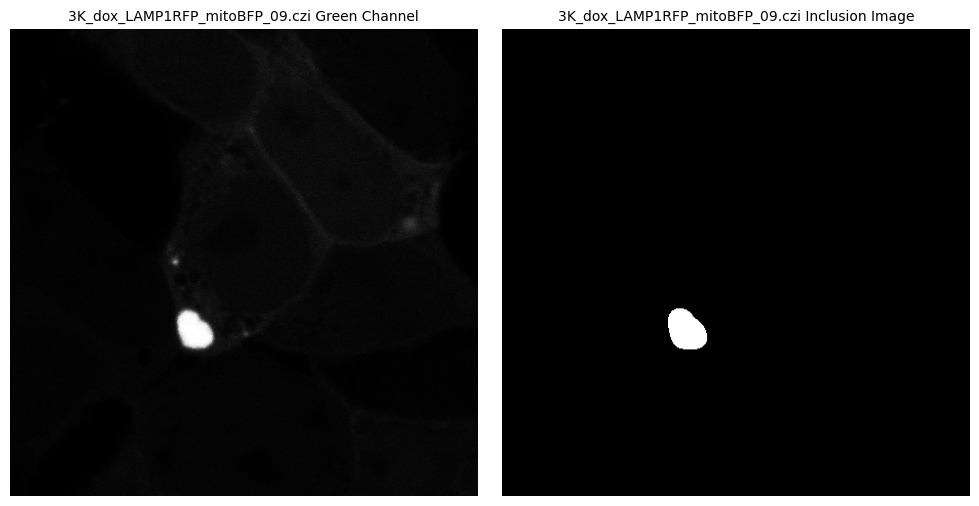

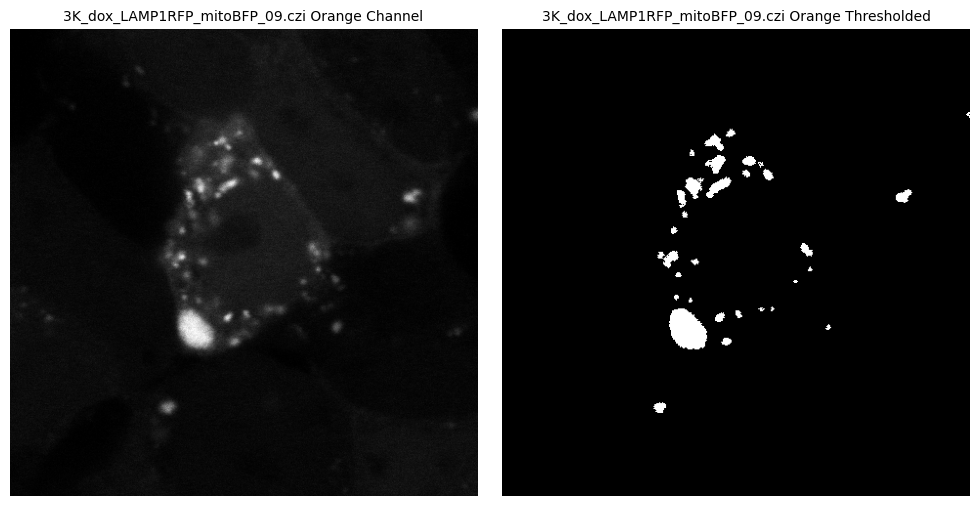

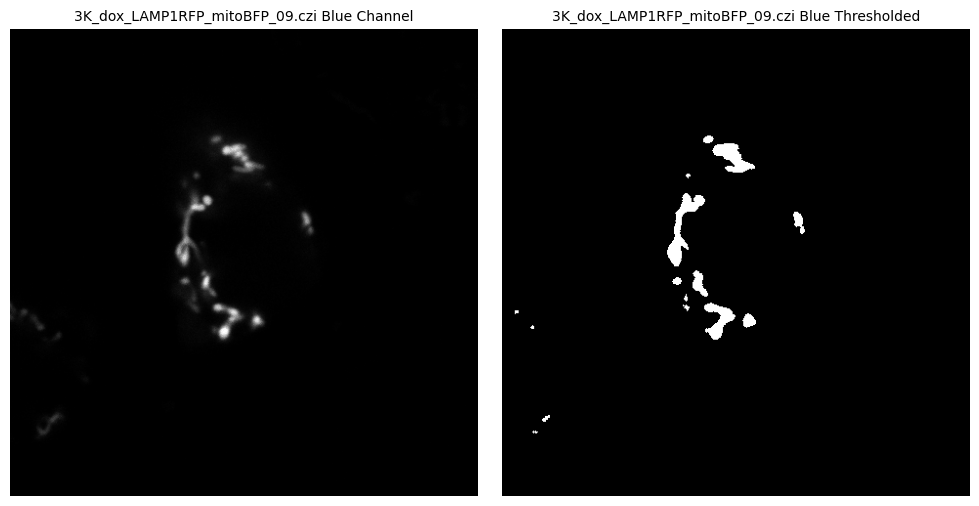

In [12]:
def main(image_folder):
    images_to_analyze = extract_image_paths(image_folder)
    output_dir = os.getcwd()
    df_cell_summary_list = []
    predictor, segmenter = get_predictor_and_segmenter(
        model_type=MODEL_TYPE,
        checkpoint=CHECKPOINT,
        device=DEVICE,
        is_tiled=False,
    )

    for path in images_to_analyze:
        image = read_image(path)
        image_squeezed = np.squeeze(image) 
    
        orange, green, blue = extract_channels(image_squeezed)

        df_cell_summary = analysis(orange, green, blue, path, predictor, segmenter)
        df_cell_summary_list.append(df_cell_summary)

    combined_cell_summary_df = pd.concat(df_cell_summary_list, ignore_index=True)
    output_summary_path = os.path.join(output_dir, '72425_SUMMARY.xlsx')
    combined_cell_summary_df.to_excel(output_summary_path, index=False)

if __name__ == "__main__":
    image_folder = '72425_images'
    main(image_folder)